# Go to Market (G2M) Insights for cab investment firm, XYZ

**Project Brief:**
In this notebook, I am going to conduct Exploratory data analysis(EDA), statistical analysis and hypothesis testing that will help me make recommendations 
to a cab investment firm called XYZ. These recommendations will help company XYZ make the best investment decision.

Below is the approach I are going to follow:
1. Problem definition
2. Data Overview 
3. Features
4. Data Exploration
5. Data Cleaning and Feature Engineering
6. Statistical Analysis
7. Data Visualizations
8. Hypothesis Testing
9. Recommendations
10. Glossary

**Before we begin, let us import all the libraries we will be using for this project**

In [1]:
# Importing libraries for Exploratory Data Analysis and Statistical Analysis
import pandas as pd
import numpy as np
import statistics
import scipy.stats as stats

# Importing libraries for making visualizations
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#We want our plots to appear inside our notebook
%matplotlib inline

# Importing libraries for coverting columns to datetime format
from datetime import datetime, timedelta

import warnings
warnings.filterwarnings('ignore')

## 1. Problem Definition

In a statement,
> With the data provided, can we make insights and recommendations to cab investment firm, XYZ?


## 2. Data Overview

Four individual datasets will be used for this project. The time period of these datasets is from 31/01/2016 to 31/12/2018.

Below, are the datasets we will be using to make our insights:

**Cab_Data.csv** – this file includes details of transaction for 2 cab companies (Yellow cab and Pink cab)

**Customer_ID.csv** – this is a mapping table that contains a unique identifier which links the customer’s 
demographic details

**Transaction_ID.csv** – this is a mapping table that contains transaction to customer mapping and payment mode

**City.csv** – this file is a list of US cities, their population and number of cab users


**Note: All monetary values are in USD**

# 3. Features

This is where we will get different information about features in each of our datasets

**Let's create a data dictionary of features for each dataset**

**1. Cab_Data.csv** 
1. Transaction_ID - The ID(unique identifier) of a transaction made by a customer.
2. Date of Travel - The date a trip occurred
3. Company - The cab company that was used by a customer. The two cab companies that were used by a customer are the yellow cab and pink cab company
4. City - The city a customer is from
5. KM Travelled - The distance travelled by a customer measured in kilometres
6. Price Charged - The fare charged by cab company per trip
7. Cost of Trip - The total cost of a trip
   
**2. Customer_ID.csv**
1. Customer ID - The ID (unique identifier) of each customer
2. Gender - The sex/gender of each customer
3. Age - The age of each customer
4. Income (USD/Month) - The total income earned by each customer per month in USD

**3. Transaction_ID.csv**
1. Transaction ID - The ID (unique identifier) of a transaction made by a customer.
2. Customer ID - The ID (unique identifier) of each customer
3. Payment_Mode - The method used by a customer to pay for a trip. The accepted methods of payment used are Cash payment and Card payment 
 
**4. City.csv**
1. City - The list of cities in the USA
2. Population - The total number of people in each city
3. Users - The total number of users of the two cab companies in each city

## 4.  Data Exploration

**Here I am going to quickly explore and understand our data. This will help us in our data cleaning and feature engineering process**

#### Reading our datasets

In [2]:
Cab_Data = pd.read_csv('Cab_Data.csv')
Cab_Data.head(3)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632


In [3]:
# Checking the bottom five rows of our dataframe
Cab_Data.tail(5)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
358542,10438877,43104,Yellow Cab,NEW YORK NY,33.32,717.59,407.8368
358543,10438879,43104,Yellow Cab,NEW YORK NY,10.89,241.23,145.0548
358544,10438880,43107,Yellow Cab,NEW YORK NY,12.43,280.44,174.5172
358545,10438881,43105,Yellow Cab,NEW YORK NY,35.70,901.89,479.8080
358546,10438882,43105,Yellow Cab,NEW,NaN,NaN,NaN


We can see see we have 3 missing values (NaN) in our Cab_Data dataset.

In [4]:
Cities = pd.read_csv('City.csv')
Cities.head(5)

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


We can see the values in our `Population` and `Users` columns have `commas`. This indicates the data formats of these columns are in string format. We will have to convert them to int format or it may affect our EDA and Visualizations.

In [5]:
Transaction_IDs = pd.read_csv('Transaction_ID.csv')
Transaction_IDs.head(3)

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash


In [6]:
Customer_IDs = pd.read_csv('Customer_ID.csv')
Customer_IDs.head(3)

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242


In [7]:
# Checking for missing values
Cab_Data.isna().sum()

Transaction ID    0
Date of Travel    0
Company           0
City              0
KM Travelled      1
Price Charged     1
Cost of Trip      1
dtype: int64

Looks like there are missing values in the following columns: `KM Travelled`, `Price Charged`, `Cost of Trip`

In [8]:
# Checking for missing values
Cab_Data.isnull().sum()

Transaction ID    0
Date of Travel    0
Company           0
City              0
KM Travelled      1
Price Charged     1
Cost of Trip      1
dtype: int64

In [9]:
Cab_Data.nunique()

Transaction ID    358547
Date of Travel      1095
Company                2
City                  20
KM Travelled         874
Price Charged      99141
Cost of Trip       16291
dtype: int64

In [10]:
# Viewing information about our dataset
Cab_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358547 entries, 0 to 358546
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  358547 non-null  int64  
 1   Date of Travel  358547 non-null  int64  
 2   Company         358547 non-null  object 
 3   City            358547 non-null  object 
 4   KM Travelled    358546 non-null  float64
 5   Price Charged   358546 non-null  float64
 6   Cost of Trip    358546 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.1+ MB


**Our Cab_Data dataset has 358,547 rows, 7 columns (features) and 3 missing values**. We can also see our Date of Travel column is not in the right format (dtype). This will be fixed in our data cleaning and feature engineering process


In [11]:
# Checking for missing values
Cities.isnull().sum()

City          0
Population    0
Users         0
dtype: int64

There are no missing values in our City dataset

In [12]:
# Viewing information about our dataframe
Cities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 612.0+ bytes


**Our City dataset has 20 rows, 3 columns (features) and 0 missing values**

In [13]:
# Checking the unique values of our Cities dataframe
Cities.City.nunique()

20

In [14]:
Cities.City.unique()

array(['NEW YORK NY', 'CHICAGO IL', 'LOS ANGELES CA', 'MIAMI FL',
       'SILICON VALLEY', 'ORANGE COUNTY', 'SAN DIEGO CA', 'PHOENIX AZ',
       'DALLAS TX', 'ATLANTA GA', 'DENVER CO', 'AUSTIN TX', 'SEATTLE WA',
       'TUCSON AZ', 'SAN FRANCISCO CA', 'SACRAMENTO CA', 'PITTSBURGH PA',
       'WASHINGTON DC', 'NASHVILLE TN', 'BOSTON MA'], dtype=object)

There are 20 cities in our dataframe. Also, there is no city called 'NEW' in our dataframe.
This has to be fixed before we continue as it could affect our analysis and visualizations.

In [15]:
# Checking for missing values
Transaction_IDs.isna().sum()

Transaction ID    0
Customer ID       0
Payment_Mode      0
dtype: int64

In [16]:
Transaction_IDs.nunique()

Transaction ID    440098
Customer ID        49171
Payment_Mode           2
dtype: int64

In [17]:
# Viewing information about our dataframe
Transaction_IDs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


**Our Transaction_ID dataset has 440,098 rows, 3 columns (features) and 0 missing values**

In [18]:
# Checking for missing values
Customer_IDs.isna().sum()

Customer ID           0
Gender                0
Age                   0
Income (USD/Month)    0
dtype: int64

In [19]:
Customer_IDs.nunique()

Customer ID           49171
Gender                    2
Age                      48
Income (USD/Month)    23341
dtype: int64

In [20]:
Customer_IDs.Age.unique()

array([28, 27, 53, 23, 33, 25, 19, 57, 20, 63, 58, 29, 38, 31, 40, 22, 18,
       34, 21, 24, 44, 30, 26, 46, 62, 47, 43, 32, 60, 52, 51, 48, 39, 45,
       61, 54, 37, 42, 41, 35, 36, 64, 55, 49, 50, 56, 65, 59],
      dtype=int64)

In [21]:
# Viewing information about our dataframe
Customer_IDs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


**Our Customer_ID dataset has 49,171 rows, 3 columns (features) and 0 missing values**

**After conducting our data exploration, here are a few things I observed**:
1. Our 4 datasets have different number of rows and columns
2. There are missing values in only our Cab_Data dataframe
3. Our last row in our Cab_Data dataframe has a City called 'NEW'. This City is not available in our Cities dataframe. It also has no values for `KM Travelled`, `Price Charged`, `Cost of Trip`. This row will not affect our analysis and insights, hence can be dropped from our Cab_Data dataframe later on in our data cleaning and feature engineering process

## 5. Data Cleaning and Feature Engineering

In this section, I am going to clean the datasets and do some feature engineering on our datasets.
Below is a list of tasks I will be executing:
1. Converting our `Date of Travel` column to `datetime` format (dtype)
2. Adding datetime parameters to `Date of Travel` column
3. Removing `spaces ('')` from the column names in our dataframes and replacing them with `(_)`
4. Removing `commas (',')`from the values in our `Population` and `Users` columns of our Cities dataframe
5. Creating a few features (columns) that will be vital for our analysis and insights
6. Fixing any rows or columns with missing values in the `Cab_Data`
7. Creating a new dataframe called `Master_Data`. This will be done by the following methods: `merging`, `appending` or `joining` our 4 dataframes. The method(s) that will be used will depend on the needs of our EDA, G2M insights and the nature of our dataframes.
9. Creating two new dataframes called `Yellow_Cab_df` and `Pink_Cab_df` from our `Master_Data`. These dataframes will contain features that are important for conducting our EDA, statiscal analysis, hypothesis testing and G2M insights.

**Let us begin**

#### 1. Converting our `Date of Travel` column to `datetime` format (dtype)

In [22]:
date_offsets = Cab_Data['Date of Travel']
base_date = pd.Timestamp('1899-12-30')
dates = [
    base_date + pd.DateOffset(date_offset)
    for date_offset in date_offsets
]

print(dates[0:5])

[Timestamp('2016-01-08 00:00:00'), Timestamp('2016-01-06 00:00:00'), Timestamp('2016-01-02 00:00:00'), Timestamp('2016-01-07 00:00:00'), Timestamp('2016-01-03 00:00:00')]


In [23]:
# Assignibg the Date of Travel column to the converted dates
Cab_Data['Date of Travel'] = dates
Cab_Data.head(3)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632


In [24]:
# Checking our minimum date
Cab_Data['Date of Travel'].min()

Timestamp('2016-01-02 00:00:00')

In [25]:
# Checking our maximum date
Cab_Data['Date of Travel'].max()

Timestamp('2018-12-31 00:00:00')

In [26]:
# Viewing information on the new Date of Trave column
Cab_Data['Date of Travel'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 358547 entries, 0 to 358546
Series name: Date of Travel
Non-Null Count   Dtype         
--------------   -----         
358547 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 2.7 MB


The problem definition says we will be using a period from 31/01/2016 to 31/12/2018 but the dates obtained after converting the 'Date of Travel' column ranges from a period of 02/01/2016 to 31/12/2018. Looks like there might be some 
discrepancies.

Let's quickly check for any missing dates

In [27]:
# Setting the datetime column as the index

given_dates = Cab_Data.set_index('Date of Travel')

missing = pd.date_range(start='2016-01-31', end = '2018-12-31', freq = 'd').difference(given_dates.index)
print('There are',len(missing),'missing dates in our dataframe.')

There are 0 missing dates in our dataframe.


In [28]:
date_test = pd.date_range(start = '2016-01-31', end = '2018-12-31', freq = 'd')
print('There are',len(date_test),'unique dates from Jan 31st, 2016 to Dec 31st, 2018')

There are 1066 unique dates from Jan 31st, 2016 to Dec 31st, 2018


This was the date range stated as the date range of our initial Cab_Data

In [29]:
actual_range = pd.date_range(start = '2016-01-02', end = '2018-12-31', freq = 'd')
print('There are',len(actual_range),'unique dates between Jan 2nd, 2016 and Dec 31st, 2018.')

There are 1095 unique dates between Jan 2nd, 2016 and Dec 31st, 2018.


The above range of dates ('Jan 2nd, 2016 and Dec 31st, 2018') are the dates I will be using for our analysis and insights since these are the dates I obtained after converting the values of the `Date of Travel` column.

**Great!! We have successfully converted our `Date of Travel` column to datetime dtype**

#### 2. Adding datetime parameters to `Date of Travel`

In [30]:
Cab_Data["Year"] = Cab_Data['Date of Travel'].dt.year
Cab_Data["Month"] = Cab_Data['Date of Travel'].dt.month
Cab_Data["Day"] = Cab_Data['Date of Travel'].dt.day
Cab_Data["Quarter"] = Cab_Data['Date of Travel'].dt.quarter
Cab_Data["Date"] = Cab_Data['Date of Travel'].dt.date
Cab_Data["Weekday"] = Cab_Data['Date of Travel'].dt.weekday

In [31]:
Cab_Data.head(3)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Year,Month,Day,Quarter,Date,Weekday
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,2016,1,8,1,2016-01-08,4
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,2016,1,6,1,2016-01-06,2
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,2016,1,2,1,2016-01-02,5


In [32]:
Cab_Data.tail(5)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Year,Month,Day,Quarter,Date,Weekday
358542,10438877,2018-01-04,Yellow Cab,NEW YORK NY,33.32,717.59,407.8368,2018,1,4,1,2018-01-04,3
358543,10438879,2018-01-04,Yellow Cab,NEW YORK NY,10.89,241.23,145.0548,2018,1,4,1,2018-01-04,3
358544,10438880,2018-01-07,Yellow Cab,NEW YORK NY,12.43,280.44,174.5172,2018,1,7,1,2018-01-07,6
358545,10438881,2018-01-05,Yellow Cab,NEW YORK NY,35.70,901.89,479.8080,2018,1,5,1,2018-01-05,4
358546,10438882,2018-01-05,Yellow Cab,NEW,NaN,NaN,NaN,2018,1,5,1,2018-01-05,4


#### 3. Removing `spaces ('')` from the column names in our datasets and replacing them with `(_)`

First of all, let us rename all columns in our Cab_Data dataset with 'spaces' by removing the spaces by replacing them with '_'

In [33]:
Cab_Data.rename(columns = {'Transaction ID':'Transaction_ID', 'KM Travelled':'KM_Travelled',
                          'Price Charged':'Price_Charged', 'Cost of Trip':'Cost_of_Trip',
                          'Date of Travel': 'Date_of_Travel'}, inplace=True)

Cab_Data.head()

,Transaction_ID,Date_of_Travel,Company,City,KM_Travelled,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,2016,1,8,1,2016-01-08,4
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,2016,1,6,1,2016-01-06,2
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,2016,1,2,1,2016-01-02,5
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.602,2016,1,7,1,2016-01-07,3
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.776,2016,1,3,1,2016-01-03,6


Next, I are going to rename all columns in our Transaction_ID dataset with 'spaces' by removing the spaces by replacing them with '_'

In [34]:
Transaction_IDs.rename(columns = {'Transaction ID':'Transaction_ID', 'Customer ID':'Customer_ID'}, inplace=True)
Transaction_IDs.head(3)

,Transaction_ID,Customer_ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash


Finally, I am going to rename all columns in our Customer_ID dataset with 'spaces' by removing the spaces by replacing them with '_'

In [35]:
Customer_IDs.rename(columns = {'Customer ID':'Customer_ID', 'Income (USD/Month)':'Monthly_Income'}, inplace=True)
Customer_IDs.head(3)

,Customer_ID,Gender,Age,Monthly_Income
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242


Done! Let's move to the next step

#### 4. Removing `commas (',')`from the values in our `Population` and `Users` columns of our City dataset

In [36]:
Cities["Population"] = Cities["Population"].astype(str).str.replace(',','').astype(int)
Cities["Users"] = Cities["Users"].astype(str).str.replace(',','').astype(int)
Cities.head()

,City,Population,Users
0,NEW YORK NY,8405837,302149
1,CHICAGO IL,1955130,164468
2,LOS ANGELES CA,1595037,144132
3,MIAMI FL,1339155,17675
4,SILICON VALLEY,1177609,27247


Excellent! We can now move to the next step

#### 5. Creating features(columns) that will be vital for our analysis and insights

**Below is a list of features (columns) we will be creating**:
1. Profit_Made - The profit made by each cab company after a trip is completed
2. Age_Bracket - The age group of users
3. Income_Group - The income bracket of users
4. Income_Level - The income level of users
5. Miles_Travelled - Distance travelled in miles
6. Charge_Per_Mile - The fare changed per miles travelled
7. Cost_of_Trip_Per_Mile - The total cost of trip per miles travelled
8. Profit_Made_Per_Mile - The profit made by each cab company after a trip is completed per miles
9. Season - Seasons of the year in the USA
10. Holiday - Some Important Holidays in the USA
11. Profit_Percentage - Percentage values of the Profit_Made column
12. User_Percentage - Percentage of users in each city per their total population

##### 1. Profit_Made

In [37]:
# Creating the new Profit_Made column
Cab_Data['Profit_Made'] = round((Cab_Data['Price_Charged'] - Cab_Data['Cost_of_Trip']),2)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,KM_Travelled,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57


##### 2. Age_Bracket

Let us quickly find out the minimum and maximum ages

In [38]:
Customer_IDs['Age'].min()

18

In [39]:
Customer_IDs['Age'].max()

65

In [40]:
# Setting the conditions for creating our Age_Bracket
Age_conditions = [
    (Customer_IDs['Age'] < 20),
    (Customer_IDs['Age'] >= 20) & (Customer_IDs['Age'] < 30),
    (Customer_IDs['Age'] >= 30) & (Customer_IDs['Age'] < 40),
    (Customer_IDs['Age'] >= 40) & (Customer_IDs['Age'] < 50),
    (Customer_IDs['Age'] >= 50) & (Customer_IDs['Age'] < 60),
    (Customer_IDs['Age'] >= 60)
]

# Grouping the ages
Age_groupings = ['<20', 
              '20-29',
              '30-39',
              '40-49',
              '50-59',
              '60-69']

Customer_IDs['Age_Bracket'] = np.select(Age_conditions, Age_groupings)
Customer_IDs.head(3)

,Customer_ID,Gender,Age,Monthly_Income,Age_Bracket
0,29290,Male,28,10813,20-29
1,27703,Male,27,9237,20-29
2,28712,Male,53,11242,50-59


##### 3. Income_Group

Let us quickly find out the minimum and maximum income earned per month

In [41]:
Customer_IDs['Monthly_Income'].min()

2000

In [42]:
Customer_IDs['Monthly_Income'].max()

35000

In [43]:
# Setting the conditions for creating our Income_Group
income_conditions = [
    (Customer_IDs['Monthly_Income'] < 5000),
    (Customer_IDs['Monthly_Income'] >= 5000) & (Customer_IDs['Monthly_Income'] < 10000),
    (Customer_IDs['Monthly_Income'] >= 10000) & (Customer_IDs['Monthly_Income'] < 15000),
    (Customer_IDs['Monthly_Income'] >= 15000) & (Customer_IDs['Monthly_Income'] < 20000),
    (Customer_IDs['Monthly_Income'] >= 20000) & (Customer_IDs['Monthly_Income'] < 25000),
    (Customer_IDs['Monthly_Income'] >= 25000) & (Customer_IDs['Monthly_Income'] < 30000),
    (Customer_IDs['Monthly_Income'] >= 30000)
]

# Grouping monthly incomes
income_groups = ['less than 5,000', 
              '5,000 - 9,999',
              '10,000 - 14,999',
              '15,000 - 19,999',
              '20,000 - 24,999',
              '25,000 - 29,999',
              'over 30,000']

Customer_IDs['Income_Group'] = np.select(income_conditions, income_groups)

Customer_IDs.head(3)

,Customer_ID,Gender,Age,Monthly_Income,Age_Bracket,Income_Group
0,29290,Male,28,10813,20-29,"10,000 - 14,999"
1,27703,Male,27,9237,20-29,"5,000 - 9,999"
2,28712,Male,53,11242,50-59,"10,000 - 14,999"


##### 4. Income_Level

In [44]:
#  Setting the conditions for creating our Income_Levels
income_level_conditions = [
    (Customer_IDs['Monthly_Income'] >= 2000) & (Customer_IDs['Monthly_Income'] <= 12000),
    (Customer_IDs['Monthly_Income'] >= 12001) & (Customer_IDs['Monthly_Income'] <= 25000),
    (Customer_IDs['Monthly_Income'] >= 25001) & (Customer_IDs['Monthly_Income'] <= 35000)
]

# # Grouping monthly incomes
income_level_groups = ['Low_Income',
                       'Middle_Income',
                       'High_Income']

Customer_IDs['Income_Level'] = np.select(income_level_conditions, income_level_groups)

Customer_IDs.head()

,Customer_ID,Gender,Age,Monthly_Income,Age_Bracket,Income_Group,Income_Level
0,29290,Male,28,10813,20-29,"10,000 - 14,999",Low_Income
1,27703,Male,27,9237,20-29,"5,000 - 9,999",Low_Income
2,28712,Male,53,11242,50-59,"10,000 - 14,999",Low_Income
3,28020,Male,23,23327,20-29,"20,000 - 24,999",Middle_Income
4,27182,Male,33,8536,30-39,"5,000 - 9,999",Low_Income


##### 5. Miles_Travelled

Here, I am going to convert our kilometre unit to miles. This is because the US does not use the metric system. And the imperial unit 'miles'. is officially used on signboards in the US.  

In [45]:
# Converting kilometres to miles (1 kilometre = 0.621371 miles)
Cab_Data['Miles_Travelled'] = Cab_Data['KM_Travelled'] * 0.621371
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,KM_Travelled,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194


In [46]:
# Next, I will remove the 'KM_Travelled' column
Cab_Data.drop('KM_Travelled', axis=1, inplace=True)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194


##### 6. Charge_Per_Miles

In [47]:
# Creating the new Charge_Per_Miles column
Cab_Data['Charge_Per_Miles'] = round((Cab_Data['Price_Charged'] / Cab_Data['Miles_Travelled']),2)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747,19.61
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638,20.16
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194,22.29


##### 7. Cost_of_Trip_Per_Miles

In [48]:
# Creating the new Cost_of_Trip_Per_Miles column
Cab_Data['Cost_of_Trip_Per_Miles'] = round((Cab_Data['Cost_of_Trip'] / Cab_Data['Miles_Travelled']),2)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747,19.61,16.58
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638,20.16,18.83
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194,22.29,17.38


##### 8. Profit_Made_Per_Miles

In [49]:
# Creating the Profit_Made_Per_Miles column
Cab_Data['Profit_Made_Per_Miles'] = round((Cab_Data['Profit_Made'] / Cab_Data['Miles_Travelled']),2)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747,19.61,16.58,3.03
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638,20.16,18.83,1.33
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194,22.29,17.38,4.91


##### 9. Season

In [50]:
# Setting the conditions for creating our Seasons
season_conditions = [
    (Cab_Data['Month'] <= 2),
    (Cab_Data['Month'] <= 5) & (Cab_Data['Month'] > 2),
    (Cab_Data['Month'] <= 8) & (Cab_Data['Month'] > 5),
    (Cab_Data['Month'] <= 11) & (Cab_Data['Month'] > 8),
    (Cab_Data['Month'] <= 12) & (Cab_Data['Month'] > 11)
]

# Grouping meteorological seasons
season_groups = ['Winter',
          'Spring',
          'Summer',
          'Autumn',
          'Winter']

Cab_Data['Season'] = np.select(season_conditions, season_groups)

Cab_Data.head().T

,0,1,2,3,4
Transaction_ID,10000011,10000012,10000013,10000014,10000015
Date_of_Travel,2016-01-08 00:00:00,2016-01-06 00:00:00,2016-01-02 00:00:00,2016-01-07 00:00:00,2016-01-03 00:00:00
Company,Pink Cab,Pink Cab,Pink Cab,Pink Cab,Pink Cab
City,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA
Price_Charged,370.95,358.52,125.2,377.4,114.62
Cost_of_Trip,313.635,334.854,97.632,351.602,97.776
Year,2016,2016,2016,2016,2016
Month,1,1,1,1,1
Day,8,6,2,7,3
Quarter,1,1,1,1,1


In [51]:
Cab_Data['Season'].astype('category')
Cab_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358547 entries, 0 to 358546
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Transaction_ID          358547 non-null  int64         
 1   Date_of_Travel          358547 non-null  datetime64[ns]
 2   Company                 358547 non-null  object        
 3   City                    358547 non-null  object        
 4   Price_Charged           358546 non-null  float64       
 5   Cost_of_Trip            358546 non-null  float64       
 6   Year                    358547 non-null  int64         
 7   Month                   358547 non-null  int64         
 8   Day                     358547 non-null  int64         
 9   Quarter                 358547 non-null  int64         
 10  Date                    358547 non-null  object        
 11  Weekday                 358547 non-null  int64         
 12  Profit_Made             358546

##### 10. Holiday

In [52]:
# Creating a new column called Holiday_Date
Cab_Data["Holiday_Date"] = Cab_Data.Month.astype(str) + Cab_Data.Day.astype(str)
Cab_Data["Holiday_Date"] = pd.to_datetime(Cab_Data['Holiday_Date'], format="%M%d")
Cab_Data["Holiday_Date"] = Cab_Data["Holiday_Date"].dt.strftime("%M-%d")
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Season,Holiday_Date
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747,19.61,16.58,3.03,Winter,01-08
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638,20.16,18.83,1.33,Winter,01-06
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194,22.29,17.38,4.91,Winter,01-02


In [53]:
# Converting the Holiday_Date column to integer data type
Cab_Data['Holidays_str'] = Cab_Data['Holiday_Date'].str.replace("-", "").astype(int)
Cab_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358547 entries, 0 to 358546
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Transaction_ID          358547 non-null  int64         
 1   Date_of_Travel          358547 non-null  datetime64[ns]
 2   Company                 358547 non-null  object        
 3   City                    358547 non-null  object        
 4   Price_Charged           358546 non-null  float64       
 5   Cost_of_Trip            358546 non-null  float64       
 6   Year                    358547 non-null  int64         
 7   Month                   358547 non-null  int64         
 8   Day                     358547 non-null  int64         
 9   Quarter                 358547 non-null  int64         
 10  Date                    358547 non-null  object        
 11  Weekday                 358547 non-null  int64         
 12  Profit_Made             358546

In [54]:
# First of all let us set our conditions for creating our holidays
holiday_conditions = [
    (Cab_Data['Holidays_str'] >= 1225) & (Cab_Data['Holidays_str'] < 1226),
    (Cab_Data['Holidays_str'] >= 1226) & (Cab_Data['Holidays_str'] < 1227),
    (Cab_Data['Holidays_str'] >= 704) & (Cab_Data['Holidays_str'] < 705),
    (Cab_Data['Holidays_str'] >= 619) & (Cab_Data['Holidays_str'] < 620),
    (Cab_Data['Holidays_str'] >= 214) & (Cab_Data['Holidays_str'] < 215),
    (Cab_Data['Holidays_str'] >= 1031) & (Cab_Data['Holidays_str'] < 1032),
    (Cab_Data['Holidays_str'] >= 401) & (Cab_Data['Holidays_str'] < 402),
    (Cab_Data['Holidays_str'] >= 501) & (Cab_Data['Holidays_str'] < 502),
    (Cab_Data['Holidays_str'] >= 317) & (Cab_Data['Holidays_str'] < 318),
    (Cab_Data['Holidays_str'] >= 101) & (Cab_Data['Holidays_str'] < 102),
    (Cab_Data['Holidays_str'] >= 1206) & (Cab_Data['Holidays_str'] < 1207),
    (Cab_Data['Holidays_str'] >= 1231)                                

]

# Next, let's us group our holidays
holiday_groups = ['Christmas Day',
         'Boxing Day',
         'Independence Day',
         'Juneteenth Day',
         'Valentine Day',
         'Halloween',
         'April Fools Day',
         'May Day',
         'Saint Patrick Day',
         'New Year Day',
         'Saint Nicholas Day',
         'New year Eve']



Cab_Data['Holiday'] = np.select(holiday_conditions, holiday_groups)

Cab_Data.head().T

,0,1,2,3,4
Transaction_ID,10000011,10000012,10000013,10000014,10000015
Date_of_Travel,2016-01-08 00:00:00,2016-01-06 00:00:00,2016-01-02 00:00:00,2016-01-07 00:00:00,2016-01-03 00:00:00
Company,Pink Cab,Pink Cab,Pink Cab,Pink Cab,Pink Cab
City,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA
Price_Charged,370.95,358.52,125.2,377.4,114.62
Cost_of_Trip,313.635,334.854,97.632,351.602,97.776
Year,2016,2016,2016,2016,2016
Month,1,1,1,1,1
Day,8,6,2,7,3
Quarter,1,1,1,1,1


In [55]:
# converting our holiday column to a category
Cab_Data['Holiday'].astype('category')
Cab_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358547 entries, 0 to 358546
Data columns (total 21 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Transaction_ID          358547 non-null  int64         
 1   Date_of_Travel          358547 non-null  datetime64[ns]
 2   Company                 358547 non-null  object        
 3   City                    358547 non-null  object        
 4   Price_Charged           358546 non-null  float64       
 5   Cost_of_Trip            358546 non-null  float64       
 6   Year                    358547 non-null  int64         
 7   Month                   358547 non-null  int64         
 8   Day                     358547 non-null  int64         
 9   Quarter                 358547 non-null  int64         
 10  Date                    358547 non-null  object        
 11  Weekday                 358547 non-null  int64         
 12  Profit_Made             358546

In [56]:
# dropping unwanted columns
Cab_Data.drop(['Holiday_Date', 'Holidays_str'], axis=1, inplace=True)
Cab_Data.head(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Season,Holiday
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,2016-01-08,4,57.32,18.920747,19.61,16.58,3.03,Winter,0
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,2016-01-06,2,23.67,17.783638,20.16,18.83,1.33,Winter,0
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,2016-01-02,5,27.57,5.617194,22.29,17.38,4.91,Winter,0


###### 11. Profit_Percentage

In [57]:
Cab_Data['Profit_Percentage'] = round(((Cab_Data['Profit_Made'] / Cab_Data['Price_Charged']) * 100), 2)
Cab_Data['Profit_Percentage']

0         15.45
1          6.60
2         22.02
3          6.84
4         14.69
          ...  
358542    43.17
358543    39.87
358544    37.77
358545    46.80
358546      NaN
Name: Profit_Percentage, Length: 358547, dtype: float64

##### 12. User_Percentage

In [58]:
# Creating a new column called User_Percentage
Cities['User_Percentage'] = round(((Cities['Users'] / Cities['Population']) *100),2)
Cities = Cities.sort_values('User_Percentage', ascending = False)
Cities.head(5)

,City,Population,Users,User_Percentage
14,SAN FRANCISCO CA,629591,213609,33.93
19,BOSTON MA,248968,80021,32.14
17,WASHINGTON DC,418859,127001,30.32
2,LOS ANGELES CA,1595037,144132,9.04
1,CHICAGO IL,1955130,164468,8.41


San Francisco,CA has the highest percentage of users of both cab companies whiles Chicago,IL has the lowest percentage of users

##### 6. Fixing any rows or columns with missing values in our `Cab_Data` 

When I explored the Cab_Data dataframe in our Data Exploration step, I found out that there were 3 missing values in our last row. I also noticed another missing value has been generated
in the newly created `Profit_Made`column. This is because the required values for calculating the `Profit_Made` for that row are missing. So now there are 4 missing values in our dataframe. Let us fix this before we proceed.

**Dropping the entire row should fix this**

**Question: How can we do this?**

**Answer: We have to drop the index of the row with missing values in our Cab_Data**

In [59]:
Cab_Data.tail(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Season,Holiday,Profit_Percentage
358544,10438880,2018-01-07,Yellow Cab,NEW YORK NY,280.44,174.5172,2018,1,7,1,2018-01-07,6,105.92,7.723642,36.31,22.60,13.71,Winter,0,37.77
358545,10438881,2018-01-05,Yellow Cab,NEW YORK NY,901.89,479.8080,2018,1,5,1,2018-01-05,4,422.08,22.182945,40.66,21.63,19.03,Winter,0,46.80
358546,10438882,2018-01-05,Yellow Cab,NEW,NaN,NaN,2018,1,5,1,2018-01-05,4,NaN,NaN,NaN,NaN,NaN,Winter,0,NaN


We can see the index of our last row is '358546'. We are going to drop the row using this index

In [60]:
Cab_Data = Cab_Data.drop(Cab_Data.index[358546])
Cab_Data.tail(3)

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Season,Holiday,Profit_Percentage
358543,10438879,2018-01-04,Yellow Cab,NEW YORK NY,241.23,145.0548,2018,1,4,1,2018-01-04,3,96.18,6.766730,35.65,21.44,14.21,Winter,0,39.87
358544,10438880,2018-01-07,Yellow Cab,NEW YORK NY,280.44,174.5172,2018,1,7,1,2018-01-07,6,105.92,7.723642,36.31,22.60,13.71,Winter,0,37.77
358545,10438881,2018-01-05,Yellow Cab,NEW YORK NY,901.89,479.8080,2018,1,5,1,2018-01-05,4,422.08,22.182945,40.66,21.63,19.03,Winter,0,46.80


Now, let us check if there are still  any missing values present in our dataframe

In [61]:
Cab_Data.isna().sum()

Transaction_ID            0
Date_of_Travel            0
Company                   0
City                      0
Price_Charged             0
Cost_of_Trip              0
Year                      0
Month                     0
Day                       0
Quarter                   0
Date                      0
Weekday                   0
Profit_Made               0
Miles_Travelled           0
Charge_Per_Miles          0
Cost_of_Trip_Per_Miles    0
Profit_Made_Per_Miles     0
Season                    0
Holiday                   0
Profit_Percentage         0
dtype: int64

Nice. There are no missing values in our dataframe. We have successfully removed all the rows and columns with missing values.

We removed our last row because it had a value called 'NEW' in the `City` column. This value is not a unique value in our Cities dataframe.
In addition to this, we have no City called 'NEW' in the USA. Also, since there was no transaction made by the customer in this row, it would not affect our insights and recommendations

#### 7. Creating a new dataframe called `Master_Data`. This will be done by the following methods: `merging`, `appending` or `joining` our 4 datasets. The method(s) that will be used will depend on the needs of our EDA, G2M insights and the nature of our datasets.

First of all, I am going to join the Cab_data and the Transaction_IDs datasets on the Transaction_ID using the `inner join` method. This will return only Customer_ID's with at least one Transaction_ID matching the Cab_data Transaction_ID column.

In [62]:
# Creating a new dataframe
df = pd.merge(left = Cab_Data, right = Transaction_IDs, how = 'inner', on = 'Transaction_ID')
df.head()

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,...,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Season,Holiday,Profit_Percentage,Customer_ID,Payment_Mode
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.635,2016,1,8,1,...,57.32,18.920747,19.61,16.58,3.03,Winter,0,15.45,29290,Card
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.854,2016,1,6,1,...,23.67,17.783638,20.16,18.83,1.33,Winter,0,6.60,27703,Card
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,125.20,97.632,2016,1,2,1,...,27.57,5.617194,22.29,17.38,4.91,Winter,0,22.02,28712,Cash
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,377.40,351.602,2016,1,7,1,...,25.80,20.610876,18.31,17.06,1.25,Winter,0,6.84,28020,Cash
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,114.62,97.776,2016,1,3,1,...,16.84,5.424569,21.13,18.02,3.10,Winter,0,14.69,27182,Card


In [63]:
# Viewing information on the new dataframe created 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 358546 entries, 0 to 358545
Data columns (total 22 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Transaction_ID          358546 non-null  int64         
 1   Date_of_Travel          358546 non-null  datetime64[ns]
 2   Company                 358546 non-null  object        
 3   City                    358546 non-null  object        
 4   Price_Charged           358546 non-null  float64       
 5   Cost_of_Trip            358546 non-null  float64       
 6   Year                    358546 non-null  int64         
 7   Month                   358546 non-null  int64         
 8   Day                     358546 non-null  int64         
 9   Quarter                 358546 non-null  int64         
 10  Date                    358546 non-null  object        
 11  Weekday                 358546 non-null  int64         
 12  Profit_Made             358546

Finally, I will join the Customer_IDs and df on the Customer_ID using the `inner join` method

In [64]:
# Creating the Master_Data dataframe
Master_Data = pd.merge(left = df, right = Customer_IDs, how = 'inner', on = 'Customer_ID')
Master_Data.head()

,Transaction_ID,Date_of_Travel,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,...,Holiday,Profit_Percentage,Customer_ID,Payment_Mode,Gender,Age,Monthly_Income,Age_Bracket,Income_Group,Income_Level
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,370.95,313.6350,2016,1,8,1,...,0,15.45,29290,Card,Male,28,10813,20-29,"10,000 - 14,999",Low_Income
1,10351127,2018-07-21,Yellow Cab,ATLANTA GA,598.70,317.4228,2018,7,21,3,...,0,46.98,29290,Cash,Male,28,10813,20-29,"10,000 - 14,999",Low_Income
2,10412921,2018-11-23,Yellow Cab,ATLANTA GA,792.05,597.4020,2018,11,23,4,...,0,24.58,29290,Card,Male,28,10813,20-29,"10,000 - 14,999",Low_Income
3,10000012,2016-01-06,Pink Cab,ATLANTA GA,358.52,334.8540,2016,1,6,1,...,0,6.60,27703,Card,Male,27,9237,20-29,"5,000 - 9,999",Low_Income
4,10320494,2018-04-21,Yellow Cab,ATLANTA GA,721.10,467.1192,2018,4,21,2,...,New year Eve,35.22,27703,Card,Male,27,9237,20-29,"5,000 - 9,999",Low_Income


In [65]:
# Viewing information on the Master_Data
Master_Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 358546 entries, 0 to 358545
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Transaction_ID          358546 non-null  int64         
 1   Date_of_Travel          358546 non-null  datetime64[ns]
 2   Company                 358546 non-null  object        
 3   City                    358546 non-null  object        
 4   Price_Charged           358546 non-null  float64       
 5   Cost_of_Trip            358546 non-null  float64       
 6   Year                    358546 non-null  int64         
 7   Month                   358546 non-null  int64         
 8   Day                     358546 non-null  int64         
 9   Quarter                 358546 non-null  int64         
 10  Date                    358546 non-null  object        
 11  Weekday                 358546 non-null  int64         
 12  Profit_Made             358546

Now, I am going to set the 'Date_of_Travel' column as the index of our `Master_Data`

In [66]:
Master_Data.set_index('Date_of_Travel', inplace = True)
Master_Data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 358546 entries, 2016-01-08 to 2018-01-07
Data columns (total 27 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Transaction_ID          358546 non-null  int64  
 1   Company                 358546 non-null  object 
 2   City                    358546 non-null  object 
 3   Price_Charged           358546 non-null  float64
 4   Cost_of_Trip            358546 non-null  float64
 5   Year                    358546 non-null  int64  
 6   Month                   358546 non-null  int64  
 7   Day                     358546 non-null  int64  
 8   Quarter                 358546 non-null  int64  
 9   Date                    358546 non-null  object 
 10  Weekday                 358546 non-null  int64  
 11  Profit_Made             358546 non-null  float64
 12  Miles_Travelled         358546 non-null  float64
 13  Charge_Per_Miles        358546 non-null  float64
 14  Cost

Before I proceed, I will create a new column called 'User_returned'

In [67]:
# Creating a new column called User_returned
Master_Data['User_returned'] = Master_Data.groupby('Customer_ID')['Transaction_ID'].transform('nunique')
Master_Data.head()

,Transaction_ID,Company,City,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Date,...,Profit_Percentage,Customer_ID,Payment_Mode,Gender,Age,Monthly_Income,Age_Bracket,Income_Group,Income_Level,User_returned
Date_of_Travel,,,,,,,,,,,,,,,,,,,,,
2016-01-08,10000011,Pink Cab,ATLANTA GA,370.95,313.6350,2016,1,8,1,2016-01-08,...,15.45,29290,Card,Male,28,10813,20-29,"10,000 - 14,999",Low_Income,3
2018-07-21,10351127,Yellow Cab,ATLANTA GA,598.70,317.4228,2018,7,21,3,2018-07-21,...,46.98,29290,Cash,Male,28,10813,20-29,"10,000 - 14,999",Low_Income,3
2018-11-23,10412921,Yellow Cab,ATLANTA GA,792.05,597.4020,2018,11,23,4,2018-11-23,...,24.58,29290,Card,Male,28,10813,20-29,"10,000 - 14,999",Low_Income,3
2016-01-06,10000012,Pink Cab,ATLANTA GA,358.52,334.8540,2016,1,6,1,2016-01-06,...,6.60,27703,Card,Male,27,9237,20-29,"5,000 - 9,999",Low_Income,4
2018-04-21,10320494,Yellow Cab,ATLANTA GA,721.10,467.1192,2018,4,21,2,2018-04-21,...,35.22,27703,Card,Male,27,9237,20-29,"5,000 - 9,999",Low_Income,4


In [68]:
Master_Data.head(3).T

Date_of_Travel,2016-01-08,2018-07-21,2018-11-23
Transaction_ID,10000011,10351127,10412921
Company,Pink Cab,Yellow Cab,Yellow Cab
City,ATLANTA GA,ATLANTA GA,ATLANTA GA
Price_Charged,370.95,598.7,792.05
Cost_of_Trip,313.635,317.4228,597.402
Year,2016,2018,2018
Month,1,7,11
Day,8,21,23
Quarter,1,3,4
Date,2016-01-08,2018-07-21,2018-11-23


In [69]:
# dropping any duplicate values that may be present
Master_Data = Master_Data.drop_duplicates()
Master_Data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 358546 entries, 2016-01-08 to 2018-01-07
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Transaction_ID          358546 non-null  int64  
 1   Company                 358546 non-null  object 
 2   City                    358546 non-null  object 
 3   Price_Charged           358546 non-null  float64
 4   Cost_of_Trip            358546 non-null  float64
 5   Year                    358546 non-null  int64  
 6   Month                   358546 non-null  int64  
 7   Day                     358546 non-null  int64  
 8   Quarter                 358546 non-null  int64  
 9   Date                    358546 non-null  object 
 10  Weekday                 358546 non-null  int64  
 11  Profit_Made             358546 non-null  float64
 12  Miles_Travelled         358546 non-null  float64
 13  Charge_Per_Miles        358546 non-null  float64
 14  Cost

#### 8. Creating two new dataframes called `Pink_Cab_df` and `Yellow_Cab_df` from our `Master_Data`. These dataframes will contain features that are important for conducting our EDA, statiscal analysis, hypothesis testing and G2M insights.

For our final step in our data cleaning and feature engineering process, we are going to create two new datafrsmes.
We will be using these dataframes for company specific analysis and visualizations.

In [70]:
# Creating the dataframe for Pink Cab Company
Pink_Cab_df = Master_Data[Master_Data['Company'] == 'Pink Cab']
Pink_Cab_df.head().T

Date_of_Travel,2016-01-08,2016-01-06,2018-10-27,2016-01-02,2016-01-07
Transaction_ID,10000011,10000012,10395626,10000013,10000014
Company,Pink Cab,Pink Cab,Pink Cab,Pink Cab,Pink Cab
City,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA
Price_Charged,370.95,358.52,167.03,125.2,377.4
Cost_of_Trip,313.635,334.854,141.934,97.632,351.602
Year,2016,2016,2018,2016,2016
Month,1,1,10,1,1
Day,8,6,27,2,7
Quarter,1,1,4,1,1
Date,2016-01-08,2016-01-06,2018-10-27,2016-01-02,2016-01-07


In [71]:
# Viewing information on the new Pink Cab dataframe created 
Pink_Cab_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 84711 entries, 2016-01-08 to 2018-01-05
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Transaction_ID          84711 non-null  int64  
 1   Company                 84711 non-null  object 
 2   City                    84711 non-null  object 
 3   Price_Charged           84711 non-null  float64
 4   Cost_of_Trip            84711 non-null  float64
 5   Year                    84711 non-null  int64  
 6   Month                   84711 non-null  int64  
 7   Day                     84711 non-null  int64  
 8   Quarter                 84711 non-null  int64  
 9   Date                    84711 non-null  object 
 10  Weekday                 84711 non-null  int64  
 11  Profit_Made             84711 non-null  float64
 12  Miles_Travelled         84711 non-null  float64
 13  Charge_Per_Miles        84711 non-null  float64
 14  Cost_of_Trip_Per_Mile

In [72]:
# Creating the dataframe for Yellow Cab Company
Yellow_Cab_df = Master_Data[Master_Data['Company'] == 'Yellow Cab']
Yellow_Cab_df.head().T

Date_of_Travel,2018-07-21,2018-11-23,2018-04-21,2018-05-04,2016-09-21
Transaction_ID,10351127,10412921,10320494,10324737,10079404
Company,Yellow Cab,Yellow Cab,Yellow Cab,Yellow Cab,Yellow Cab
City,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA,ATLANTA GA
Price_Charged,598.7,792.05,721.1,138.4,704.3
Cost_of_Trip,317.4228,597.402,467.1192,87.5088,494.208
Year,2018,2018,2018,2018,2016
Month,7,11,4,5,9
Day,21,23,21,4,21
Quarter,3,4,2,2,3
Date,2018-07-21,2018-11-23,2018-04-21,2018-05-04,2016-09-21


In [73]:
# Viewing information on the Yellow Cab dataframe created 
Yellow_Cab_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 273835 entries, 2018-07-21 to 2018-01-07
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Transaction_ID          273835 non-null  int64  
 1   Company                 273835 non-null  object 
 2   City                    273835 non-null  object 
 3   Price_Charged           273835 non-null  float64
 4   Cost_of_Trip            273835 non-null  float64
 5   Year                    273835 non-null  int64  
 6   Month                   273835 non-null  int64  
 7   Day                     273835 non-null  int64  
 8   Quarter                 273835 non-null  int64  
 9   Date                    273835 non-null  object 
 10  Weekday                 273835 non-null  int64  
 11  Profit_Made             273835 non-null  float64
 12  Miles_Travelled         273835 non-null  float64
 13  Charge_Per_Miles        273835 non-null  float64
 14  Cost

In [74]:
# Checking to see if the length of the Pink Cab and Yellow Cab dataframes are equal to the length of the Master_Data dataframe
len(Pink_Cab_df) + len(Yellow_Cab_df)

358546

**Great!!** We are now done with our data cleaning and feature engineering process. We can begin visualizing our data.

### 6. Statistical Analysis

 In this section, we are going to perform some statistical analysis on our `Pink_Cab_df` and `Yellow_Cab_df`. Below is a list of techniques we will be using for this analysis:
1. Using the describe() function
2. Outlier Detection using the IQR (InterQuartile Range) method
3. Skewness
4. Kurtosi

###### 1. Using the describe() function 

**a. Using the describe() function on the Pink_Cab_df**

In [75]:
Pink_Cab_df.Gender.describe()

count     84711
unique        2
top        Male
freq      47231
Name: Gender, dtype: object

In [76]:
Pink_Cab_df.Age.describe()

count    84711.000000
mean        35.322414
std         12.644780
min         18.000000
25%         25.000000
50%         33.000000
75%         42.000000
max         65.000000
Name: Age, dtype: float64

In [77]:
Pink_Cab_df.City.describe()

count              84711
unique                19
top       LOS ANGELES CA
freq               19865
Name: City, dtype: object

In [78]:
Pink_Cab_df.Season.describe()

count      84711
unique         4
top       Autumn
freq       31239
Name: Season, dtype: object

In [79]:
Pink_Cab_df.Cost_of_Trip.describe()

count    84711.000000
mean       248.148682
std        135.403345
min         19.000000
25%        131.868000
50%        246.330000
75%        360.180000
max        576.000000
Name: Cost_of_Trip, dtype: float64

In [80]:
Pink_Cab_df.Price_Charged.describe()

count    84711.000000
mean       310.800856
std        181.995661
min         15.600000
25%        159.970000
50%        298.060000
75%        441.505000
max       1623.480000
Name: Price_Charged, dtype: float64

In [81]:
Pink_Cab_df.Charge_Per_Miles.describe()

count    84711.000000
mean        22.158248
std          4.235055
min         10.200000
25%         19.210000
50%         21.560000
75%         24.510000
max         62.840000
Name: Charge_Per_Miles, dtype: float64

In [82]:
Pink_Cab_df.Profit_Made.describe()

count    84711.000000
mean        62.652176
std         77.590390
min       -220.060000
25%         11.210000
50%         41.500000
75%         93.965000
max       1119.480000
Name: Profit_Made, dtype: float64

In [83]:
Pink_Cab_df.Profit_Made_Per_Miles.describe()

count    84711.000000
mean         4.457746
std          4.340758
min         -7.910000
25%          1.430000
50%          3.900000
75%          6.890000
max         46.100000
Name: Profit_Made_Per_Miles, dtype: float64

In [84]:
Pink_Cab_df.Miles_Travelled.describe()

count    84711.000000
mean        14.018078
std          7.600046
min          1.180605
25%          7.456452
50%         13.943565
75%         20.480388
max         29.825808
Name: Miles_Travelled, dtype: float64

In [85]:
Pink_Cab_df.Payment_Mode.describe()

count     84711
unique        2
top        Card
freq      50719
Name: Payment_Mode, dtype: object

In [86]:
Pink_Cab_df.Income_Level.describe()

count             84711
unique                3
top       Middle_Income
freq              43830
Name: Income_Level, dtype: object

In [87]:
Pink_Cab_df.Income_Group.describe()

count               84711
unique                  7
top       20,000 - 24,999
freq                16937
Name: Income_Group, dtype: object

In [88]:
Pink_Cab_df.Monthly_Income.describe()

count    84711.000000
mean     15059.047137
std       7991.077762
min       2000.000000
25%       8371.000000
50%      14713.000000
75%      21055.000000
max      35000.000000
Name: Monthly_Income, dtype: float64

In [89]:
Pink_Cab_df.Age_Bracket.describe()

count     84711
unique        6
top       20-29
freq      27470
Name: Age_Bracket, dtype: object

In [90]:
Pink_Cab_df.Date.describe()

count          84711
unique          1095
top       2018-01-05
freq             528
Name: Date, dtype: object

**b. Using the describe() function on the Yellow_Cab_df**

In [91]:
Yellow_Cab_df.Age.describe()

count    273835.000000
mean         35.342071
std          12.579328
min          18.000000
25%          25.000000
50%          33.000000
75%          42.000000
max          65.000000
Name: Age, dtype: float64

In [92]:
Yellow_Cab_df.Gender.describe()

count     273835
unique         2
top         Male
freq      158178
Name: Gender, dtype: object

In [93]:
Yellow_Cab_df.Season.describe()

count     273835
unique         4
top       Autumn
freq       89172
Name: Season, dtype: object

In [94]:
Yellow_Cab_df.Price_Charged.describe()

count    273835.000000
mean        458.301994
std         288.519474
min          20.730000
25%         226.680000
50%         425.120000
75%         634.050000
max        2048.030000
Name: Price_Charged, dtype: float64

In [95]:
Yellow_Cab_df.Cost_of_Trip.describe()

count    273835.000000
mean        297.906691
std         162.543574
min          22.800000
25%         158.400000
50%         295.596000
75%         432.432000
max         691.200000
Name: Cost_of_Trip, dtype: float64

In [96]:
Yellow_Cab_df.Miles_Travelled.describe()

count    273835.000000
mean         14.023447
std           7.601997
min           1.180605
25%           7.450238
50%          13.943565
75%          20.480388
max          29.825808
Name: Miles_Travelled, dtype: float64

In [97]:
Yellow_Cab_df.Payment_Mode.describe()

count     273835
unique         2
top         Card
freq      164288
Name: Payment_Mode, dtype: object

In [98]:
Yellow_Cab_df.City.describe()

count          273835
unique             19
top       NEW YORK NY
freq            85514
Name: City, dtype: object

In [99]:
Yellow_Cab_df.Charge_Per_Miles.describe()

count    273835.000000
mean         32.689343
std           9.253812
min          14.740000
25%          25.440000
50%          30.180000
75%          38.810000
max          86.830000
Name: Charge_Per_Miles, dtype: float64

In [100]:
Yellow_Cab_df.Profit_Made.describe()

count    273835.000000
mean        160.395301
std         171.973777
min        -176.930000
25%          37.200000
50%         102.080000
75%         228.930000
max        1463.970000
Name: Profit_Made, dtype: float64

In [101]:
Yellow_Cab_df.Profit_Made_Per_Miles.describe()

count    273835.000000
mean         11.445247
std           9.327271
min          -8.040000
25%           4.190000
50%           9.020000
75%          17.550000
max          66.170000
Name: Profit_Made_Per_Miles, dtype: float64

In [102]:
Yellow_Cab_df.Age_Bracket.describe()

count     273835
unique         6
top        20-29
freq       88682
Name: Age_Bracket, dtype: object

In [103]:
Yellow_Cab_df.Income_Level.describe()

count            273835
unique                3
top       Middle_Income
freq             141768
Name: Income_Level, dtype: object

In [104]:
Yellow_Cab_df.Income_Group.describe()

count              273835
unique                  7
top       10,000 - 14,999
freq                54447
Name: Income_Group, dtype: object

In [105]:
Yellow_Cab_df.Monthly_Income.describe()

count    273835.000000
mean      15046.833823
std        7963.887609
min        2000.000000
25%        8438.000000
50%       14679.000000
75%       21026.000000
max       34996.000000
Name: Monthly_Income, dtype: float64

In [106]:
Yellow_Cab_df.Date.describe()

count         273835
unique          1095
top       2018-01-05
freq            1225
Name: Date, dtype: object

###### Observations

After conducting a statistical analysis using the describe() function on the `Pink_Cab_df` and `Yellow_Cab_df` , here are a few things I observed in some columns in these dataframes:

1. **Income_Level:**
* `Middle_Income` earners use both cab companies the most. This category has a frequency of 43,824 and 141,761 for Pink_Cab and Yellow_Cab respectively.

2. **Season:**
* Both cab companies are used the most in `Autumn` with a frequency of 31,239 and 89,172 for Pink_Cab and Yellow_Cab respectively.

3. **Age_Bracket:**
* Users within the Age_Bracket of `20-29` years used both cab companies  with a frequency of 27,470 and 88,682 for Pink_Cab and Yellow_Cab respectively.

4. **Income_Group:**
* Users within the Income_Group of `10,000 - 14,999` USD used both cab companies  with a frequency of 16,937 and 54,447 for Pink_Cab and Yellow_Cab respectively.

5. **City:** 
* The City with the most Pink_Cab users is `Los Angeles CA`  with a frequency of 19,865.
* The City with the most Yellow_Cab users is `New York NY` and 85,514.

6. **Payment_Mode:**
* Most users of both companies preferred `Card` payment to `Cash` payment.

7. **Gender:**
* Most of the transactions made for both cab companies were `Male` users with a frequency of 47,231 and 188,178 for Pink_Cab and Yellow_Cab respectively.

8. **Miles_Travelled:**
* The minimum and maximum distances travelled by both cab companies are `1.18` miles and `29.83` miles respectively.

9. **Price_Charged:**
* The mean value(`310.8` USD) of the Price_Charged by the Pink_Cab company is greater than the median value/50%(`298.06` USD). This indicates a positively skewed distribution (right skewed distribution) in this column. I will discuss this further when I discuss skewness. This could be due to the presence of outliers.
* The mean value(`458.3`) of the price charged by the Yellow_Cab company is greater than the median value/50%(`425.1`). This indicates a positively skewed distribution (right skewed distribution) in this column. I will discuss this further when I discuss skewness. This could be due to the presence of outliers.
* The minimum and maximum prices charged by the Pink_Cab company are `15.60` USD and `1,623.48` USD respectively.
* The minimum and maximum prices charged by the Yellow_Cab company are `20.73` USD and `2,048.00` USD respectively.

10. **Cost_of_Trip:**
* The mean value(`248.15` USD) of the cost of a trip by the Pink_Cab company is almost the same the median value/50%(`246.33` USD). There may or may not be any outliers in this column.
* The mean value(`297.91`) of the cost of a trip by the Yellow_Cab company is greater than the median value/50%(`295.60`. There may or may not be any outliers in this column.
* The minimum and maximum cost of a trip by the Pink_Cab company were `691.20` USD and `22.80` USD respectively.
* The minimum and maximum prices charged by the Yellow_Cab company were `19.00` USD and `576.00` USD respectively.

11. **Profit_Made:**
* The mean value(`62.65` USD) of the profit made by Pink_Cab company is greater than the median value/50%(`41.50` USD). This indicates a positively skewed distribution (right skewed distribution) in this column. I will discuss this further when I discuss skewness. This could be due to the presence of outliers.
* The mean value(`160.40`) of the Price_Charged by Yellow_Cab company is greater than the median value/50%(`102.08`). This indicates a positively skewed distribution (right skewed distribution) in this column. I will discuss this further when I discuss skewness. This could be due to the presence of outliers.
* The minimum and maximum prices charged by the Pink_Cab company were `-220.06` USD and `1,119.48` USD respectively.
* The minimum and maximum prices charged by the Yellow_Cab company were `-176.93` USD and `1,463.97` USD respectively.
* There are negative profit made values by both cab companies. This shouldn't be so. This indicates the prices charged by some drivers were less than the price of a cost of a trip in both cab companies.

12. **Age:**
* The minimum and maximum ages of users of both cab companies are `18` years and `65` years respectively.

13. **Monthly_Income:**
* The minimum and maximum monthly income earned by users of Pink_Cab are `2,000` USD and `34,996` USD respectively.
* The minimum and maximum monthly income earned by users of Pink_Cab are `2,000` USD and `35,000` USD respectively.

14. **Date:**
* The date with most trips was 5th January,2018 with a frequency of 528 and 1,225 for Pink_Cab and Yellow_Cab respectively.

###### 2. Outlier Detection using the IQR (InterQuartile Range) method

**a. Outlier Detection using the IQR (InterQuartile Range) method  on the Pink_Cab_df**

In [107]:
# Creating a function to detect outliers
def find_outliers_IQR(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    IQR = q3 - q1
    
    outliers = df[((df < (q1 - 1.5 * IQR)) | (df > (q3 + 1.5 * IQR)))]
    
    return outliers

In [108]:
outliers = find_outliers_IQR(Master_Data['Miles_Travelled'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:0
min outlier value:nan
max outlier value:nan


Series([], Name: Miles_Travelled, dtype: float64)

In [109]:
outliers = find_outliers_IQR(Master_Data['Age'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:0
min outlier value:nan
max outlier value:nan


Series([], Name: Age, dtype: int64)

**Now, I am going to check for outliers in some relevant columns of the Pink Cab dataframe**

In [110]:
outliers = find_outliers_IQR(Pink_Cab_df['Price_Charged'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:237
min outlier value:864.15
max outlier value:1623.48


Date_of_Travel
2016-01-02     997.84
2016-01-03    1021.72
2016-01-03     983.99
2016-01-03     870.29
2016-01-03    1022.59
               ...   
2018-09-22    1235.96
2018-09-20    1020.10
2018-09-22    1079.21
2018-09-20     963.78
2018-01-05     868.90
Name: Price_Charged, Length: 237, dtype: float64

In [111]:
outliers = find_outliers_IQR(Pink_Cab_df['Cost_of_Trip'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:0
min outlier value:nan
max outlier value:nan


Series([], Name: Cost_of_Trip, dtype: float64)

In [112]:
outliers = find_outliers_IQR(Pink_Cab_df['Profit_Made'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:4074
min outlier value:-220.06
max outlier value:1119.48


Date_of_Travel
2016-04-03    276.35
2016-11-07    281.48
2016-12-18    332.57
2017-02-12    239.41
2016-12-30    234.88
               ...  
2018-12-28    289.29
2018-12-29    219.62
2018-12-29    238.82
2018-01-05    380.31
2018-01-05    225.05
Name: Profit_Made, Length: 4074, dtype: float64

In [113]:
outliers = find_outliers_IQR(Pink_Cab_df['Charge_Per_Miles'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:1789
min outlier value:10.2
max outlier value:62.84


Date_of_Travel
2016-01-02    34.91
2016-01-03    34.56
2017-02-05    35.22
2016-01-03    35.62
2016-01-03    34.56
              ...  
2018-10-06    38.90
2018-10-04    32.91
2018-10-06    34.66
2018-10-05    32.90
2018-01-05    35.78
Name: Charge_Per_Miles, Length: 1789, dtype: float64

**b. Outlier Detection using the IQR (InterQuartile Range) method  on the Yellow_Cab_df**

**Now, I am going to check for outliers in some relevant columns of the Yellow Cab dataframe**

In [114]:
outliers = find_outliers_IQR(Yellow_Cab_df['Price_Charged'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:3229
min outlier value:1245.14
max outlier value:2048.03


Date_of_Travel
2016-12-03    1372.11
2016-01-10    1386.52
2016-11-20    1272.43
2018-03-23    1407.01
2018-05-03    1315.13
               ...   
2018-01-12    1293.92
2018-02-17    1725.77
2018-02-16    1993.83
2018-05-05    1257.88
2018-05-26    1276.81
Name: Price_Charged, Length: 3229, dtype: float64

In [115]:
outliers = find_outliers_IQR(Yellow_Cab_df['Cost_of_Trip'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:0
min outlier value:nan
max outlier value:nan


Series([], Name: Cost_of_Trip, dtype: float64)

In [116]:
outliers = find_outliers_IQR(Yellow_Cab_df['Profit_Made'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:14080
min outlier value:516.53
max outlier value:1463.97


Date_of_Travel
2018-05-04    602.88
2016-04-16    576.28
2016-02-05    617.22
2016-11-19    542.11
2017-05-29    630.50
               ...  
2018-05-18    557.54
2018-05-26    690.83
2018-06-02    586.82
2018-10-12    553.79
2018-10-20    542.73
Name: Profit_Made, Length: 14080, dtype: float64

In [117]:
outliers = find_outliers_IQR(Yellow_Cab_df['Charge_Per_Miles'])

print("number of outliers:" + str(len(outliers)))
print("min outlier value:" + str(outliers.min()))
print("max outlier value:" + str(outliers.max()))
outliers

number of outliers:2354
min outlier value:58.87
max outlier value:86.83


Date_of_Travel
2017-04-16    60.34
2017-05-06    62.88
2017-03-19    60.83
2017-05-04    62.28
2017-02-26    66.34
              ...  
2018-01-06    61.47
2018-02-17    73.42
2018-02-16    67.98
2018-02-20    60.48
2018-02-23    64.02
Name: Charge_Per_Miles, Length: 2354, dtype: float64

###### Observations

After conducting the outlier detection step, I found some outliers. Below is
a list of the number of outliers, minimum outlier and maximum outlier in some
columns of the `Master_Data`, `Pink_Cab_df` and `Yellow_Cab_df` dataframes:

**Master_Data:**
* There are no outliers in the`Age` column.
* There are no outliers in the`Miles_Travelled` column.

**Pink_Cab_df:**
* There are no outliers in the`Cost_of_Trip` column.
* There are 237 outliers in the `Price_Charged` column. The minimum and maximum outlier values are `864.15` and `1,623.48` USD respectively.
* There are 4,074 outliers in the `Profit_Made` column. The minimum and maximum outlier values are `-220.06` and `1,119.48` USD respectively.
* There are 1,789 outliers in the `Charged_Per_Miles` column. The minimum and maximum outlier values are `10.2` and `62.84` USD respectively.

**Yellow_Cab_df:**
* There are no outliers in the`Cost_of_Trip` column.
* There are 3,229 outliers in the `Price_Charged` column. The minimum and maximum outlier values are `1,245.4` and `2048.03` USD respectively.
* There are 14,080 outliers in the `Profit_Made` column. The minimum and maximum outlier values are `1,463.97` and `516.53` USD respectively.
* There are 2,334 outliers in the `Charged_Per_Miles` column. The minimum and maximum outlier values are `58.87` and `86.83` USD respectively.

###### 3. Skewness

In [118]:
Pink_Cab_df.skew()

Transaction_ID           -0.015549
Price_Charged             0.456799
Cost_of_Trip              0.086610
Year                     -0.089936
Month                    -0.556092
Day                       0.021252
Quarter                  -0.552868
Weekday                  -0.605667
Profit_Made               1.865525
Miles_Travelled           0.056841
Charge_Per_Miles          1.053672
Cost_of_Trip_Per_Miles   -0.004944
Profit_Made_Per_Miles     0.965274
Profit_Percentage        -0.360335
Customer_ID               1.086466
Age                       0.688532
Monthly_Income            0.305211
User_returned             0.740792
dtype: float64

In [119]:
Yellow_Cab_df.skew()

Transaction_ID            0.005088
Price_Charged             0.748758
Cost_of_Trip              0.087610
Year                     -0.073400
Month                    -0.355898
Day                       0.021056
Quarter                  -0.373900
Weekday                  -0.616131
Profit_Made               1.667638
Miles_Travelled           0.055530
Charge_Per_Miles          0.873558
Cost_of_Trip_Per_Miles   -0.000890
Profit_Made_Per_Miles     0.853468
Profit_Percentage        -0.158332
Customer_ID               0.827032
Age                       0.684242
Monthly_Income            0.310998
User_returned             0.285784
dtype: float64

###### Observations

The Profit_Made and Price_Charged columns in both the Pink_Cab and Yellow_Cab dataframes have high positive skewness values. This is indication of extremes values and outliers in these columns. This would affect other columns that are dependent on the aforementioned columns. 
Also, it suggests fluctuations in Profit_Made by the two cab companies

###### 4. Kurtosis

In [120]:
Pink_Cab_df.kurtosis()

Transaction_ID           -1.209826
Price_Charged            -0.197032
Cost_of_Trip             -1.081153
Year                     -1.431318
Month                    -0.815157
Day                      -1.199623
Quarter                  -1.002440
Weekday                  -0.703088
Profit_Made               6.949460
Miles_Travelled          -1.127563
Charge_Per_Miles          3.091132
Cost_of_Trip_Per_Miles   -1.206066
Profit_Made_Per_Miles     2.705363
Profit_Percentage         0.366103
Customer_ID              -0.135122
Age                      -0.461635
Monthly_Income           -0.672449
User_returned            -0.215518
dtype: float64

In [121]:
Yellow_Cab_df.kurtosis()

Transaction_ID           -1.195592
Price_Charged             0.368374
Cost_of_Trip             -1.076999
Year                     -1.433506
Month                    -1.098364
Day                      -1.199984
Quarter                  -1.234705
Weekday                  -0.694390
Profit_Made               3.185384
Miles_Travelled          -1.126639
Charge_Per_Miles          0.232327
Cost_of_Trip_Per_Miles   -1.206447
Profit_Made_Per_Miles     0.226709
Profit_Percentage        -0.684294
Customer_ID              -1.050778
Age                      -0.457790
Monthly_Income           -0.656649
User_returned            -0.853498
dtype: float64

###### Observations

* The Profit_Made column of the Pink_Cab_df has a kurtosis value of 6.9 indicating that the distribution of profits made is leptokurtic, this means it has heavy tails and a high peak compared to a normal distribution. In practical terms, this suggests that there are significant outliers or extreme values in the Profit column, leading to a distribution that is more concentrated around the mean with heavier tails. It also implies that there are more extreme values present in the Profit_Made column compared to a normal distribution.

* The Profit_Made column of the Yellow_Cab_df has a kurtosis value of 3.18 indicating that the distribution of profits made is leptokurtic, this means it has heavy tails and a high peak compared to a normal distribution. In practical terms, this suggests that there are significant outliers or extreme values in the Profit column, leading to a distribution that is more concentrated around the mean with heavier tails. It also implies that there are more extreme values present in the Profit_Made column compared to a normal distribution.

* There are columns in both dataframes that are mesokurtic. For a distribution to be considered mesokurtic, its kurtosis value should be approximately equal to 0. However, in practice, the range of values for a distribution to be considered mesokurtic is typically within a small interval around 0. Generally, values within the range of -0.5 to 0.5 are often considered indicative of a mesokurtic distribution.


**Interpretations**

* There is a high presence of outliers in both dataframes
* A high positive skewness in our Profit_Made and Price_Charged columns indicate a potential for large positive returns but also higher risk.
* A high kurtosis in some of our columns indicate a higher likelihood of extreme outcomes, whether positive or negative, which would be very instrumental during risk assessment and strategy selection

### 7. Data Visualizations

In this section, I am going to perform some visuzations on our data and make some insights.
Below is a list  of visualizations I will be performing:
* Heatmaps
* Pairplots
* Crosstab Visualizations
* Scatterplots
* Pie Charts
* Boxplots
* Bar Charts
* Line Charts
* Histograms

##### Heatmaps

**a. Master_Data**

In [122]:
# Creating a correlation matrix for the Master_Data
Master_Data.corr()

,Transaction_ID,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Profit_Percentage,Customer_ID,Age,Monthly_Income,User_returned
Transaction_ID,1.000000,-0.053073,-0.003911,0.941632,0.296538,0.016629,0.287292,-0.069299,-0.086951,-0.001541,-0.106556,-0.013205,-0.110228,-0.094248,-0.017367,-0.001174,-0.001382,0.011711
Price_Charged,-0.053073,1.000000,0.859706,-0.036460,-0.061516,-0.004085,-0.065208,0.052451,0.864276,0.835561,0.482749,0.182725,0.473492,0.439942,-0.177172,-0.003128,0.003296,0.257671
Cost_of_Trip,-0.003911,0.859706,1.000000,-0.002076,-0.008037,0.002324,-0.007920,0.001332,0.486088,0.981829,0.062547,0.166860,0.031189,0.017603,0.003093,-0.000242,-0.000561,0.023116
Year,0.941632,-0.036460,-0.002076,1.000000,-0.025614,-0.017932,-0.025336,-0.077958,-0.060335,-0.001147,-0.072608,-0.004225,-0.076116,-0.069454,-0.002799,-0.000512,-0.001487,-0.000466
Month,0.296538,-0.061516,-0.008037,-0.025614,1.000000,0.036267,0.971037,0.013788,-0.097332,-0.001872,-0.124715,-0.037625,-0.124342,-0.098836,-0.044587,-0.002284,0.000162,0.033070
Day,0.016629,-0.004085,0.002324,-0.017932,0.036267,1.000000,0.035654,-0.003387,-0.009277,0.001676,-0.011691,0.002839,-0.012996,-0.011108,0.000842,-0.001266,0.001805,0.001085
Quarter,0.287292,-0.065208,-0.007920,-0.025336,0.971037,0.035654,1.000000,0.012645,-0.103764,-0.001776,-0.132754,-0.037917,-0.132806,-0.107840,-0.043451,-0.002354,-0.000167,0.031448
Weekday,-0.069299,0.052451,0.001332,-0.077958,0.013788,-0.003387,0.012645,1.000000,0.088428,0.001615,0.106953,0.000847,0.113251,0.123002,0.001327,-0.001791,-0.001305,0.000192
Profit_Made,-0.086951,0.864276,0.486088,-0.060335,-0.097332,-0.009277,-0.103764,0.088428,1.000000,0.462672,0.764340,0.148304,0.779385,0.735363,-0.306169,-0.005114,0.006191,0.418085
Miles_Travelled,-0.001541,0.835561,0.981829,-0.001147,-0.001872,0.001676,-0.001776,0.001615,0.462672,1.000000,-0.000479,0.000106,-0.000530,0.000074,0.000428,-0.000431,-0.000496,-0.000466


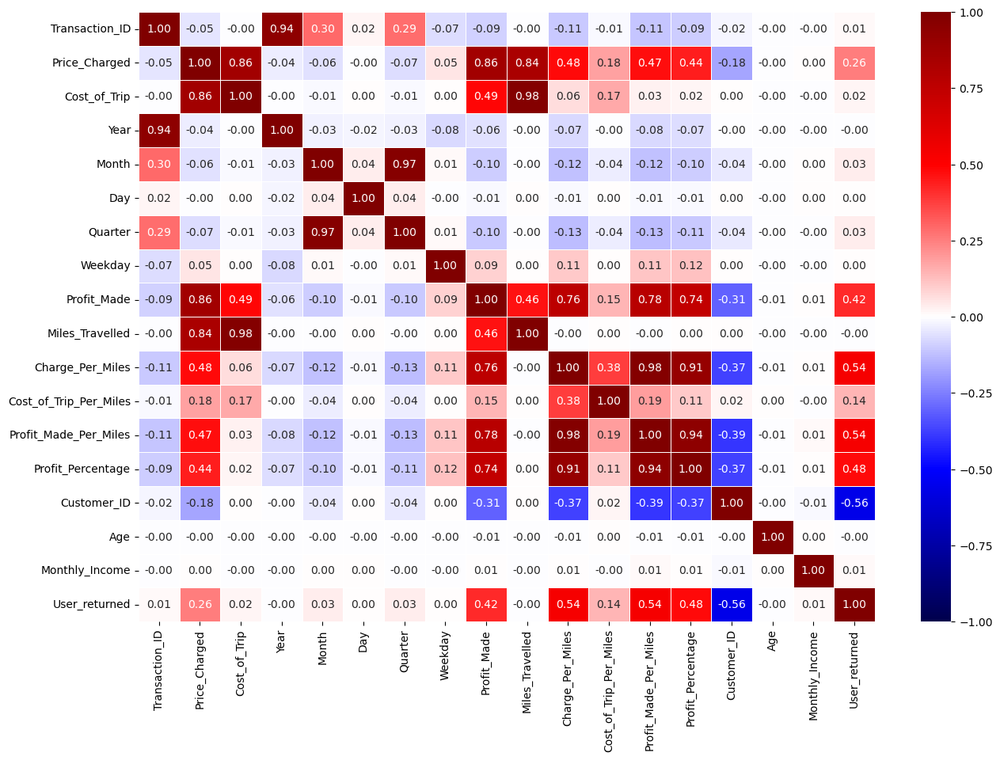

In [123]:
# Visualizing the correlation matrix
corr_matrix = Master_Data.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="seismic",
                vmin=-1, vmax=1);

In [124]:
# Creating a correlation matrix for the Pink_Cab_df
Pink_Cab_df.corr()

,Transaction_ID,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Profit_Percentage,Customer_ID,Age,Monthly_Income,User_returned
Transaction_ID,1.000000,-0.016311,0.003230,0.944629,0.268322,0.012508,0.260746,-0.065710,-0.043896,0.002544,-0.056361,0.008221,-0.056838,-0.033164,-0.014470,-0.002472,-0.006383,0.025689
Price_Charged,-0.016311,1.000000,0.921896,-0.030985,0.027243,-0.006129,0.024963,0.064613,0.736791,0.927765,0.333401,0.004719,0.324218,0.303918,-0.056342,-0.006657,0.002075,0.076736
Cost_of_Trip,0.003230,0.921896,1.000000,0.003962,-0.001766,-0.000835,-0.003271,0.007285,0.417290,0.993367,0.006340,0.103915,-0.017189,-0.024759,-0.000834,-0.005009,0.000326,0.004174
Year,0.944629,-0.030985,0.003962,1.000000,-0.039391,-0.020638,-0.037919,-0.073991,-0.079592,0.003381,-0.103472,0.007072,-0.102543,-0.076741,-0.001218,-0.002339,-0.006026,0.002112
Month,0.268322,0.027243,-0.001766,-0.039391,1.000000,0.044919,0.969295,0.017626,0.066984,-0.002191,0.089810,0.005713,0.086334,0.083960,-0.043303,0.000204,-0.000218,0.072631
Day,0.012508,-0.006129,-0.000835,-0.020638,0.044919,1.000000,0.042718,-0.007896,-0.012920,-0.001739,-0.016024,0.008431,-0.017529,-0.019619,0.001575,-0.003102,0.001771,0.000956
Quarter,0.260746,0.024963,-0.003271,-0.037919,0.969295,0.042718,1.000000,0.015778,0.064262,-0.003562,0.087292,0.004794,0.084084,0.082156,-0.042866,0.000658,-0.001100,0.070998
Weekday,-0.065710,0.064613,0.007285,-0.073991,0.017626,-0.007896,0.015778,1.000000,0.138842,0.007557,0.174850,0.001081,0.170349,0.165684,0.000972,0.004196,-0.001050,-0.000169
Profit_Made,-0.043896,0.736791,0.417290,-0.079592,0.066984,-0.012920,0.064262,0.138842,1.000000,0.442633,0.770959,-0.170274,0.790481,0.756076,-0.130700,-0.006872,0.004300,0.172708
Miles_Travelled,0.002544,0.927765,0.993367,0.003381,-0.002191,-0.001739,-0.003562,0.007557,0.442633,1.000000,0.005728,0.002834,0.004947,0.004288,-0.000828,-0.004264,0.000444,0.004236


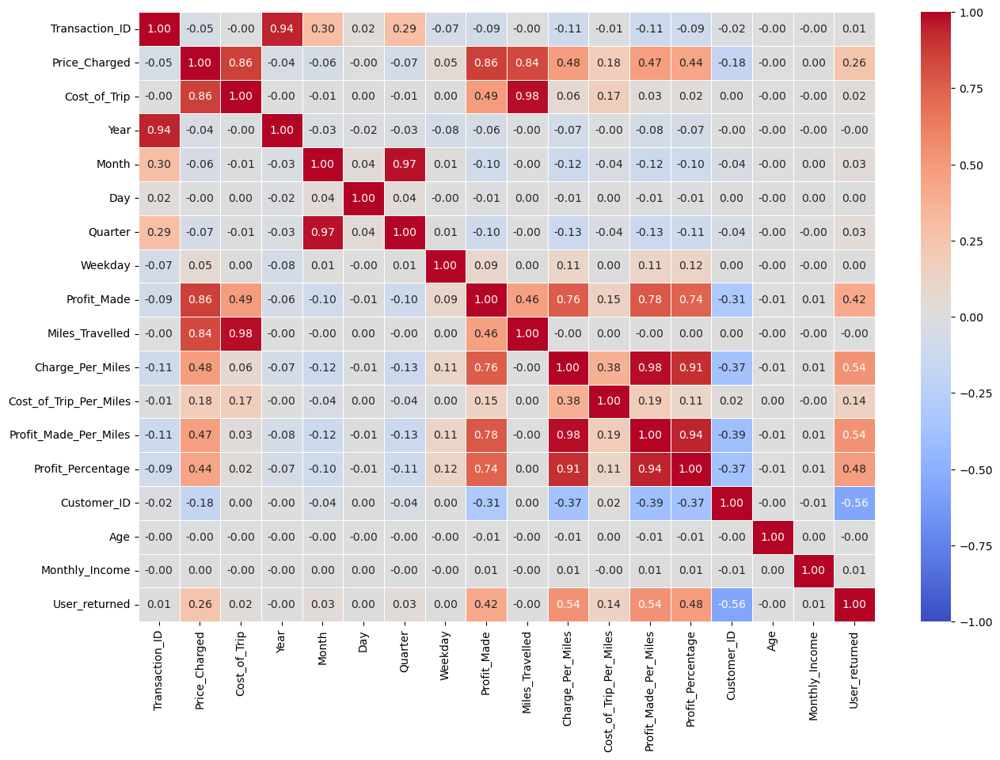

In [125]:
# Visualizing the correlation matrix
Pink_corr_matrix = Pink_Cab_df.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="coolwarm",
                vmin=-1, vmax=1);

In [126]:
# Creating a correlation matrix for the Pink_Cab_df
Yellow_Cab_df.corr()

,Transaction_ID,Price_Charged,Cost_of_Trip,Year,Month,Day,Quarter,Weekday,Profit_Made,Miles_Travelled,Charge_Per_Miles,Cost_of_Trip_Per_Miles,Profit_Made_Per_Miles,Profit_Percentage,Customer_ID,Age,Monthly_Income,User_returned
Transaction_ID,1.000000,-0.058276,-0.003041,0.940782,0.304470,0.017939,0.294706,-0.070355,-0.094895,-0.002793,-0.124439,-0.002552,-0.123141,-0.109687,-0.017762,-0.000758,0.000151,0.011637
Price_Charged,-0.058276,1.000000,0.853881,-0.037984,-0.067842,-0.004392,-0.071935,0.051872,0.870636,0.859582,0.447994,-0.000800,0.444565,0.419475,-0.208814,-0.002784,0.003887,0.257531
Cost_of_Trip,-0.003041,0.853881,1.000000,-0.002836,-0.001680,0.002872,-0.001137,-0.000691,0.487387,0.993390,-0.001615,0.099900,-0.014131,-0.022228,0.000649,0.000876,-0.000688,-0.001625
Year,0.940782,-0.037984,-0.002836,1.000000,-0.021833,-0.017084,-0.021914,-0.079167,-0.061046,-0.002545,-0.079548,-0.002530,-0.078607,-0.069863,-0.003092,0.000061,-0.000083,-0.000105
Month,0.304470,-0.067842,-0.001680,-0.021833,1.000000,0.033845,0.971456,0.012847,-0.112231,-0.001761,-0.148417,-0.000540,-0.147180,-0.133062,-0.043883,-0.002995,0.000236,0.033528
Day,0.017939,-0.004392,0.002872,-0.017084,0.033845,1.000000,0.033709,-0.002000,-0.010083,0.002731,-0.014507,0.000833,-0.014497,-0.010224,0.000612,-0.000698,0.001818,0.000738
Quarter,0.294706,-0.071935,-0.001137,-0.021914,0.971456,0.033709,1.000000,0.011913,-0.119609,-0.001227,-0.158670,-0.000720,-0.157329,-0.144366,-0.042565,-0.003222,0.000073,0.031906
Weekday,-0.070355,0.051872,-0.000691,-0.079167,0.012847,-0.002000,0.011913,1.000000,0.087679,-0.000223,0.116639,-0.003529,0.116163,0.118071,0.001347,-0.003654,-0.001382,-0.000390
Profit_Made,-0.094895,0.870636,0.487387,-0.061046,-0.112231,-0.010083,-0.119609,0.087679,1.000000,0.503199,0.753123,-0.095764,0.759201,0.724760,-0.350940,-0.005499,0.007172,0.433594
Miles_Travelled,-0.002793,0.859582,0.993390,-0.002545,-0.001761,0.002731,-0.001227,-0.000223,0.503199,1.000000,-0.001642,-0.001013,-0.001502,-0.001146,0.000744,0.000760,-0.000787,-0.001922


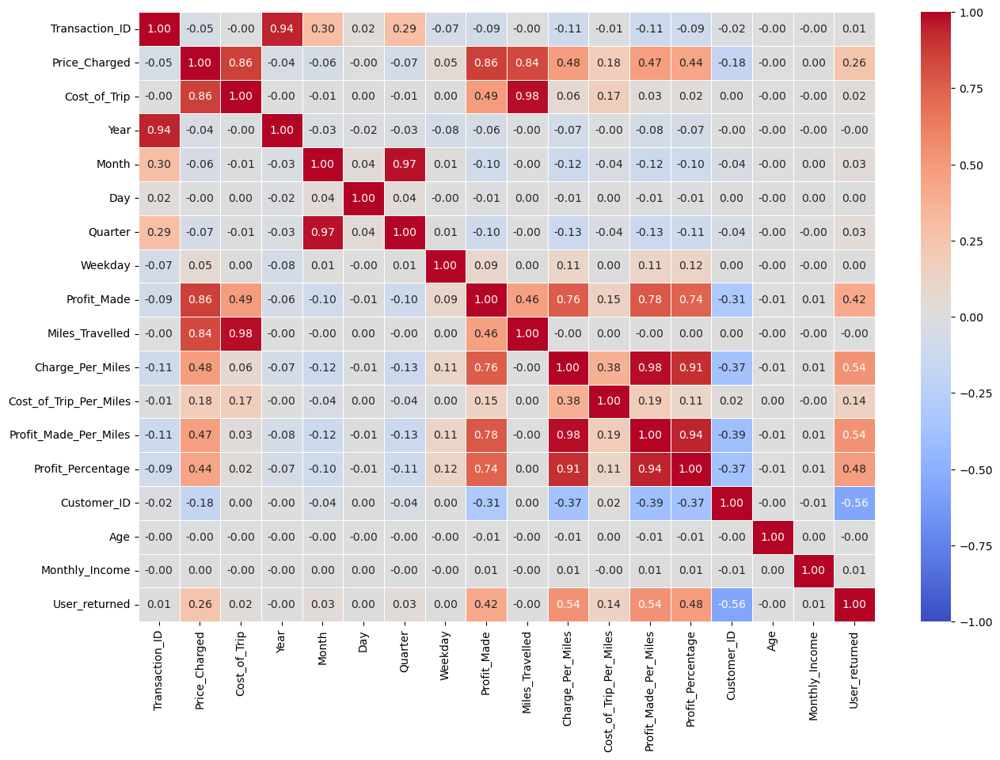

In [127]:
# Visualizing the correlation matrix
Yellow_corr_matrix = Yellow_Cab_df.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="coolwarm",
                 vmin=-1, vmax=1);

##### PairPlot

**a. Master_Data**

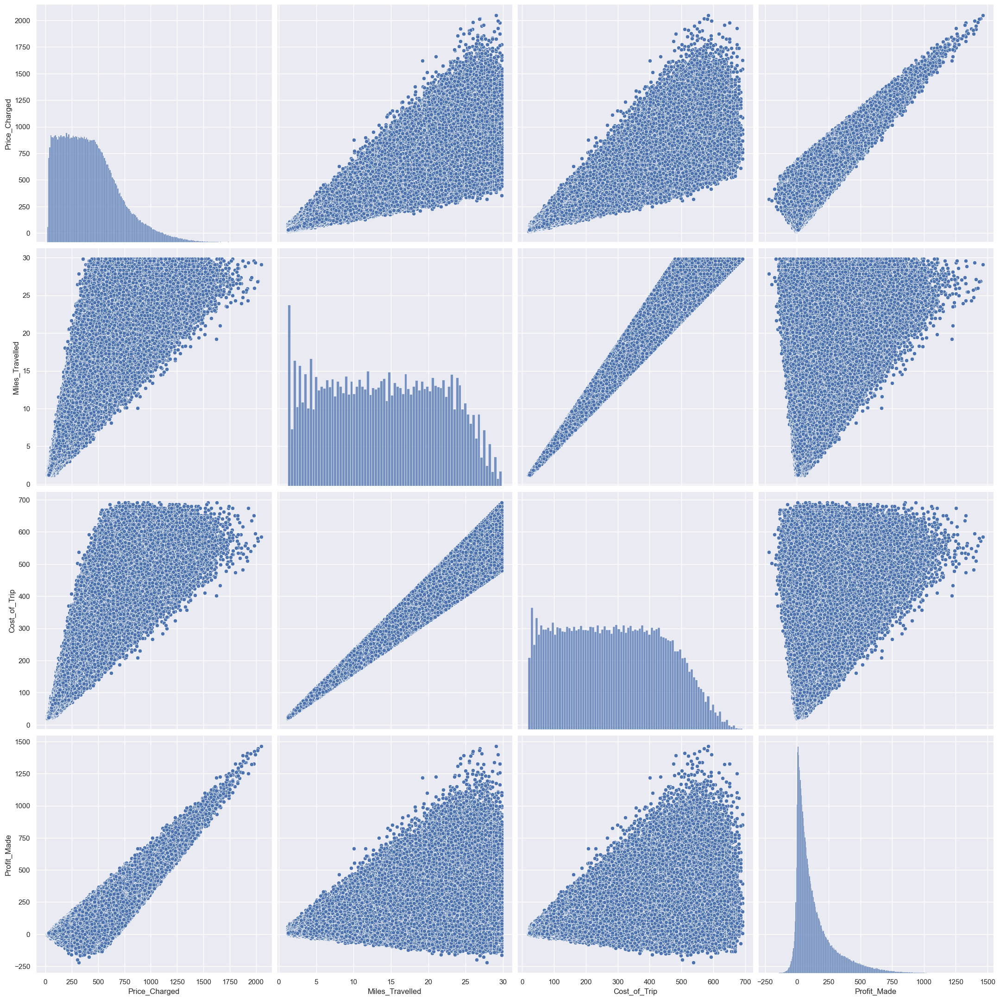

In [128]:
sns.set()
cols = ['Price_Charged', 'Miles_Travelled','Cost_of_Trip',
       'Profit_Made']
sns.pairplot(Master_Data[cols], height = 5.5)
plt.show()

**b. Pink_Cab_df**

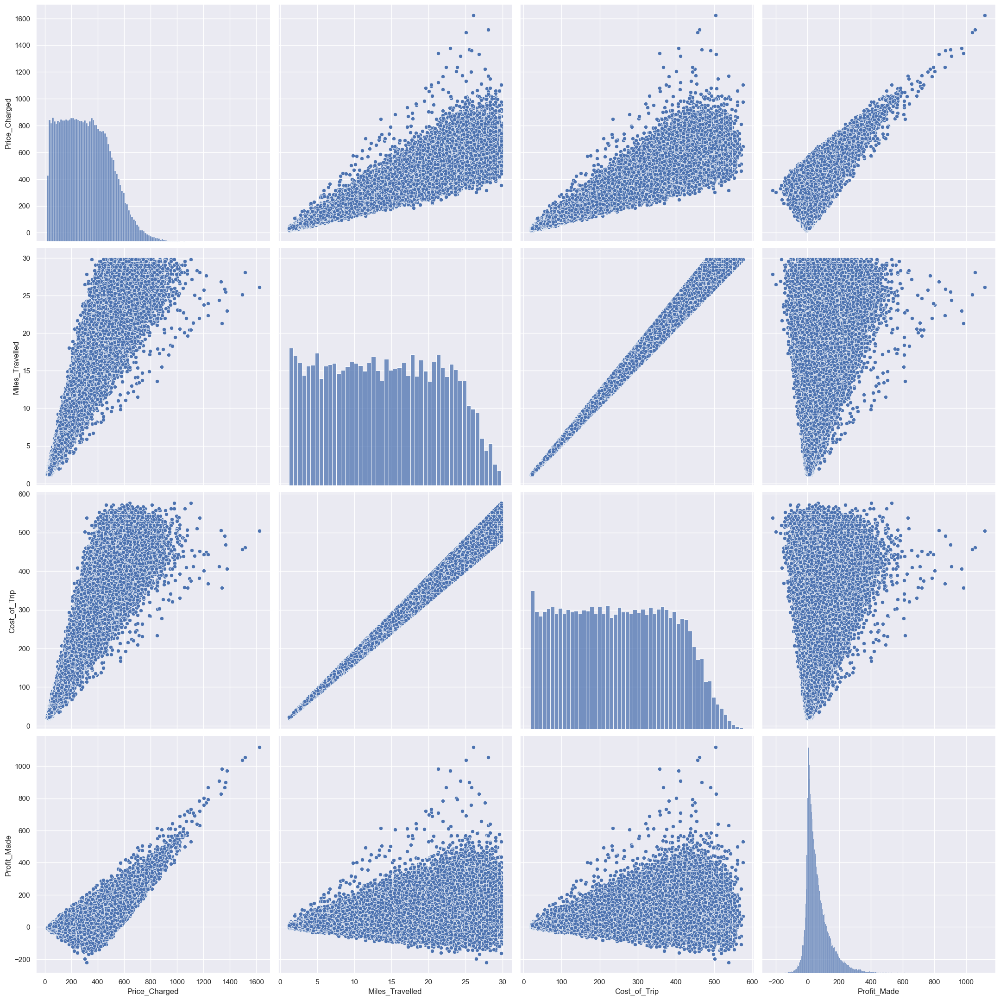

In [129]:
sns.set()
cols = ['Price_Charged', 'Miles_Travelled','Cost_of_Trip',
       'Profit_Made']
sns.pairplot(Pink_Cab_df[cols], height = 5.5)
plt.show()

**b. Yellow_Cab_df**

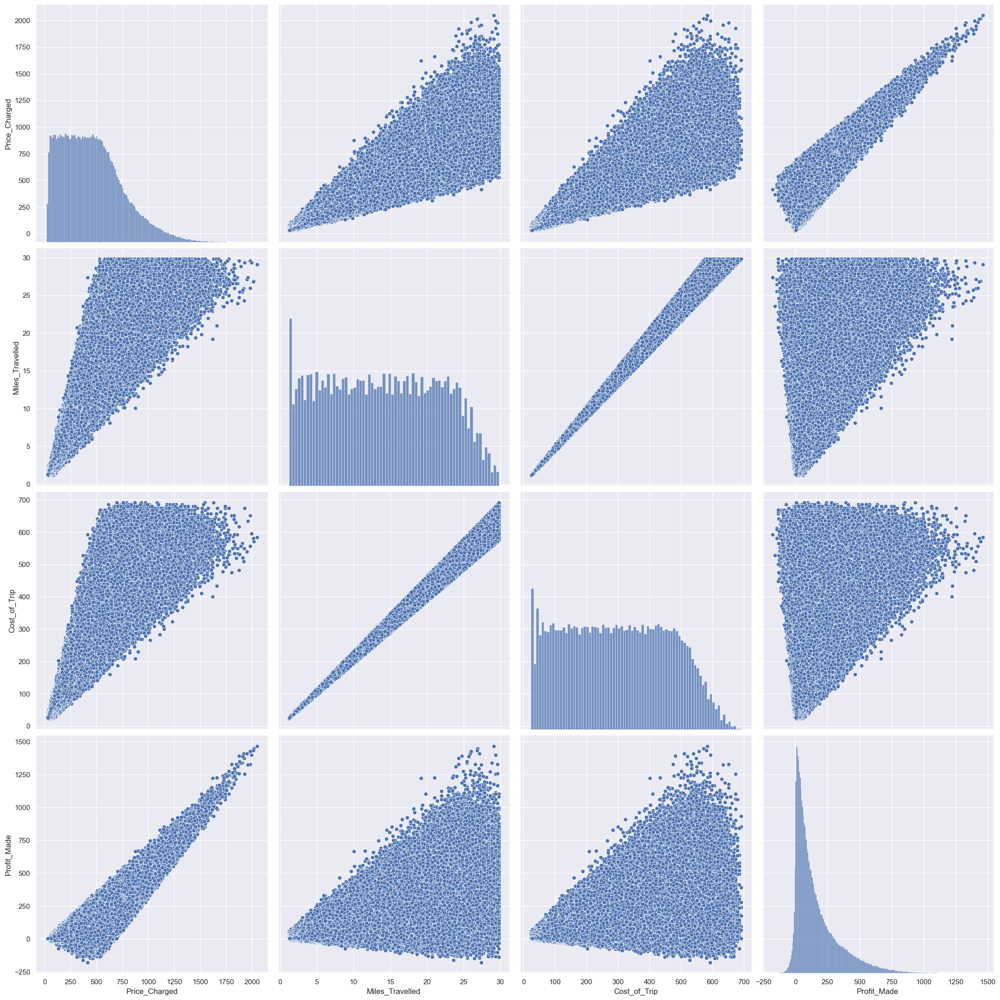

In [130]:
sns.set()
cols = ['Price_Charged', 'Miles_Travelled','Cost_of_Trip',
       'Profit_Made']
sns.pairplot(Yellow_Cab_df[cols], height = 5.5)
plt.show()

###### 3. Crosstab Visualization

**a.Pink_Cab_df**

In [131]:
# Creating a crosstab instance
pd.crosstab(Pink_Cab_df.Payment_Mode, Pink_Cab_df.Gender)

Gender,Female,Male
Payment_Mode,,
Card,22438,28281
Cash,15042,18950


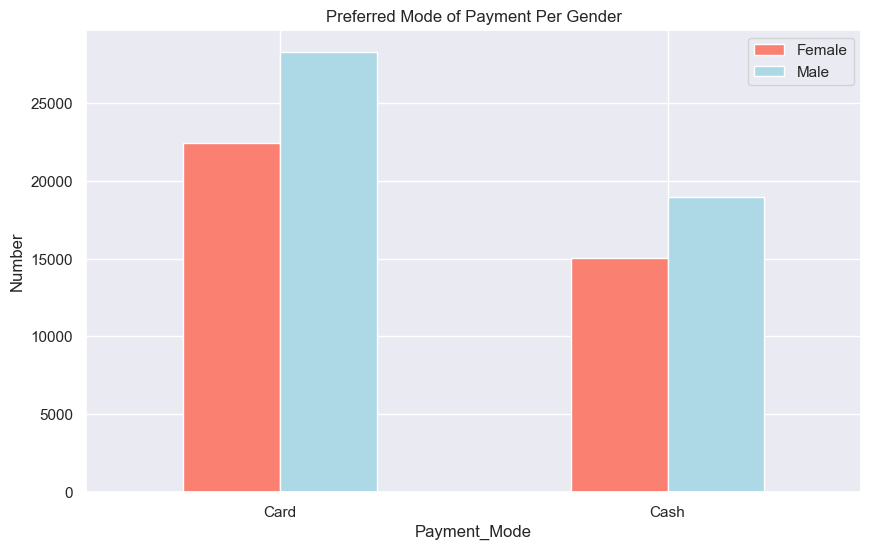

In [132]:
# Visualizing the crosstab instance
pd.crosstab(Pink_Cab_df.Payment_Mode, Pink_Cab_df.Gender).plot(kind="bar",
                                   figsize=(10, 6),
                                   color=["salmon", "lightblue"])

# Adding some communication
plt.title("Preferred Mode of Payment Per Gender")
plt.xlabel("Payment_Mode")
plt.ylabel("Number")
plt.legend(["Female", "Male"])
plt.xticks(rotation=0);

**b. Yellow_Cab_df**

In [133]:
# Creating a crosstab instance
pd.crosstab(Yellow_Cab_df.Payment_Mode, Yellow_Cab_df.Gender)

Gender,Female,Male
Payment_Mode,,
Card,69384,94904
Cash,46273,63274


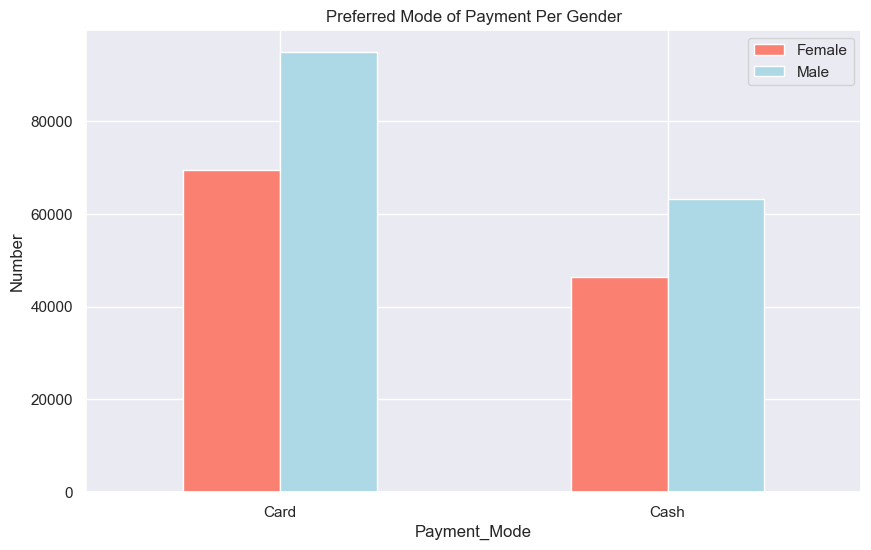

In [134]:
# 
pd.crosstab(Yellow_Cab_df.Payment_Mode, Yellow_Cab_df.Gender).plot(kind="bar",
                                   figsize=(10, 6),
                                   color=["salmon", "lightblue"])

# Adding some communication
plt.title("Preferred Mode of Payment Per Gender")
plt.xlabel("Payment_Mode")
plt.ylabel("Number")
plt.legend(["Female", "Male"])
plt.xticks(rotation=0);

##### Scatterplot

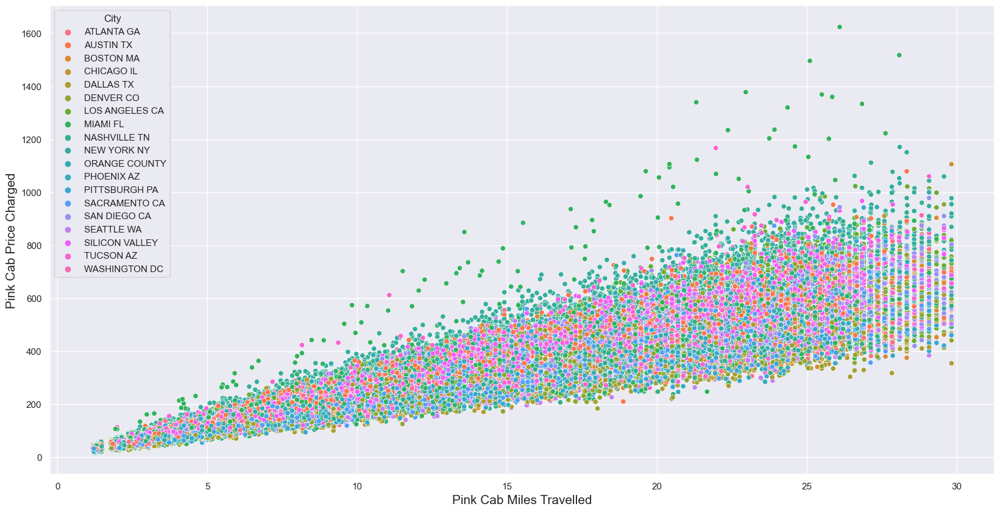

In [135]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=Pink_Cab_df, x=Pink_Cab_df["Miles_Travelled"], y=Pink_Cab_df['Price_Charged'], hue="City")
plt.ylabel('Pink Cab Price Charged', fontsize=15);
plt.xlabel('Pink Cab Miles Travelled', fontsize=15);

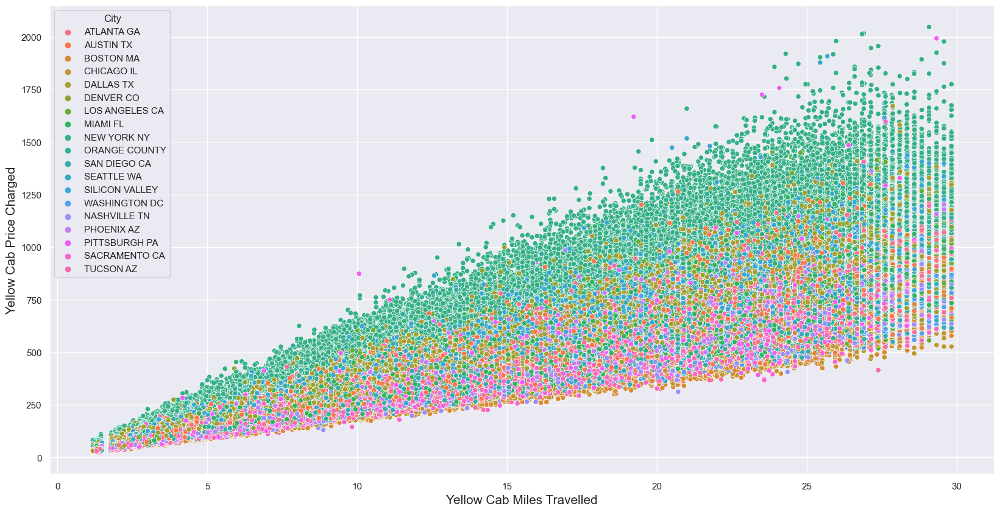

In [136]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=Yellow_Cab_df, x=Yellow_Cab_df["Miles_Travelled"], y=Yellow_Cab_df['Price_Charged'], hue="City")
plt.ylabel('Yellow Cab Price Charged', fontsize=15);
plt.xlabel('Yellow Cab Miles Travelled', fontsize=15);

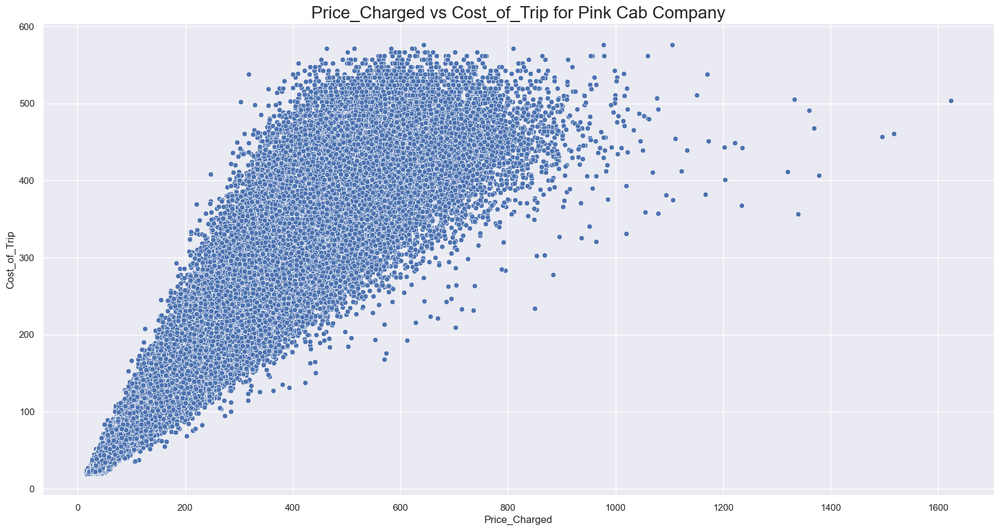

In [137]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=Pink_Cab_df, x='Price_Charged', y='Cost_of_Trip').set_title("Price_Charged vs Cost_of_Trip for Pink Cab Company", fontsize=20);

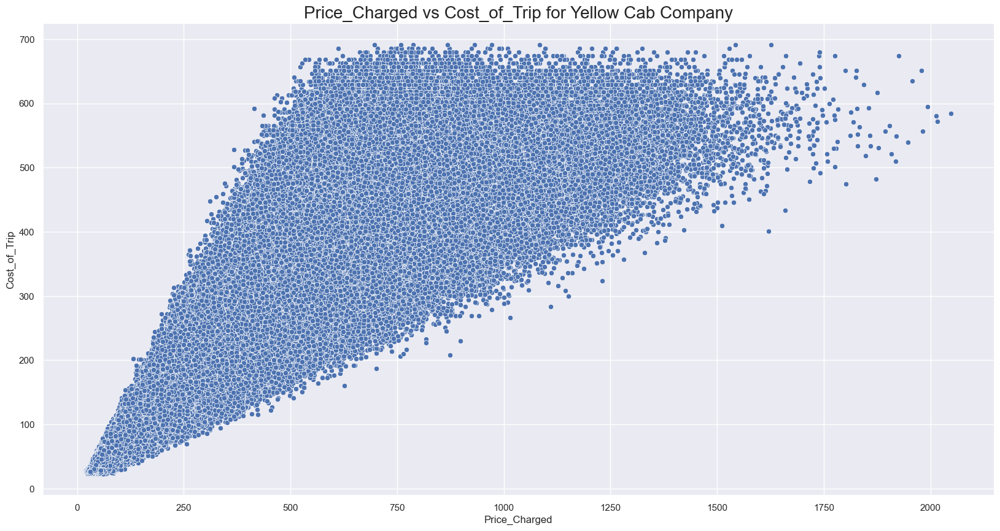

In [138]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=Yellow_Cab_df, x='Price_Charged', y='Cost_of_Trip').set_title("Price_Charged vs Cost_of_Trip for Yellow Cab Company", fontsize=20);

##### Pie Charts

In [139]:
# Creating a function for our pie chart labels of the Pink_Cab_df
def labels_pink(values):
    return f'{values/100 * len(Pink_Cab_df):.0f}\n{values:.0f}%'

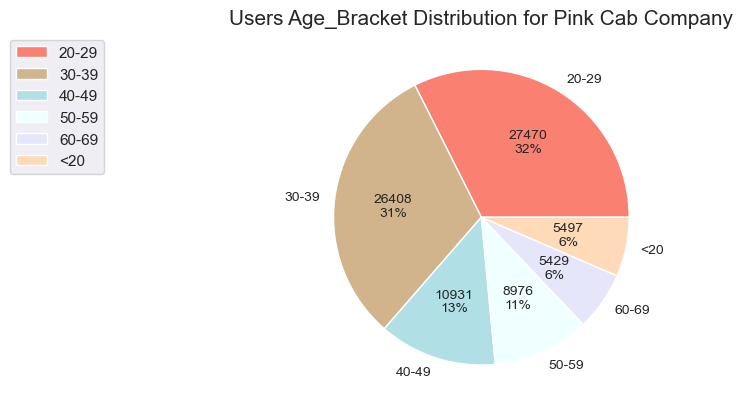

In [140]:
# Aggregating and plotting the Age_Bracket column
Pink_Cab_df.groupby('Age_Bracket').count().plot(kind = 'pie',
                                                      autopct = labels_pink,
                                                      textprops = {'fontsize':10},
                                                      colors = ['salmon', 'tan',
                                                               'powderblue', 'azure',
                                                              'lavender', 'peachpuff'],
                                               y = 'Age', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Users Age_Bracket Distribution for Pink Cab Company',
         loc='center', fontsize=15)
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

In [141]:
# Creating a function for our pie chart labels of the Yellow_Cab_df
def labels_yellow(values):
    return f'{values/100 * len(Yellow_Cab_df):.0f}\n{values:.0f}%'

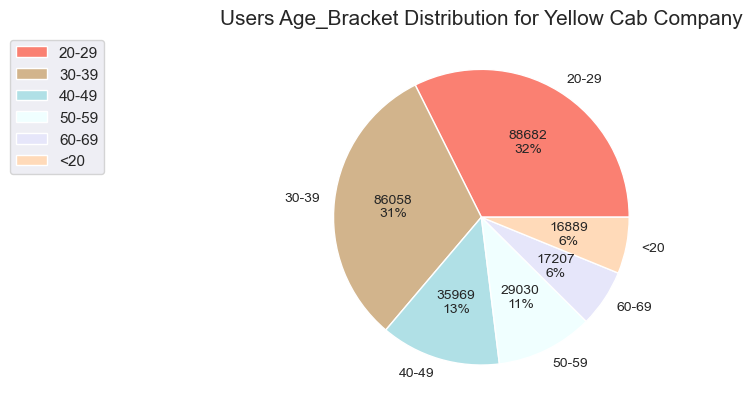

In [142]:
# Aggregating and plotting the Age_Bracket column
Yellow_Cab_df.groupby('Age_Bracket').count().plot(kind = 'pie',
                                                      autopct = labels_yellow,
                                                      textprops = {'fontsize':10},
                                                      colors = ['salmon', 'tan',
                                                               'powderblue', 'azure',
                                                              'lavender', 'peachpuff'],
                                               y = 'Age', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Users Age_Bracket Distribution for Yellow Cab Company',
         loc='center', fontsize=15)
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

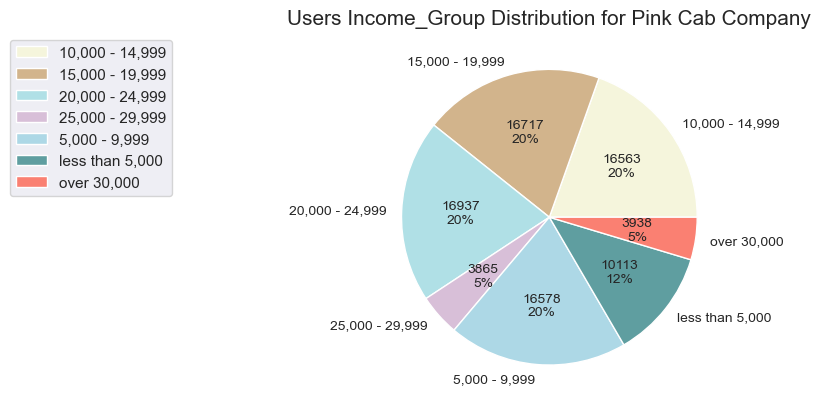

In [143]:
# Aggregating and plotting  Income_Group column
Pink_Cab_df.groupby('Income_Group').count().plot(kind = 'pie',
                                                      autopct = labels_pink,
                                                      textprops = {'fontsize':10},
                                                      colors = ['beige', 'tan',
                                                               'powderblue', 'thistle',
                                                              'lightblue', 'cadetblue', 'salmon'],
                                               y = 'Monthly_Income', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Users Income_Group Distribution for Pink Cab Company',loc='center', fontsize=15)
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

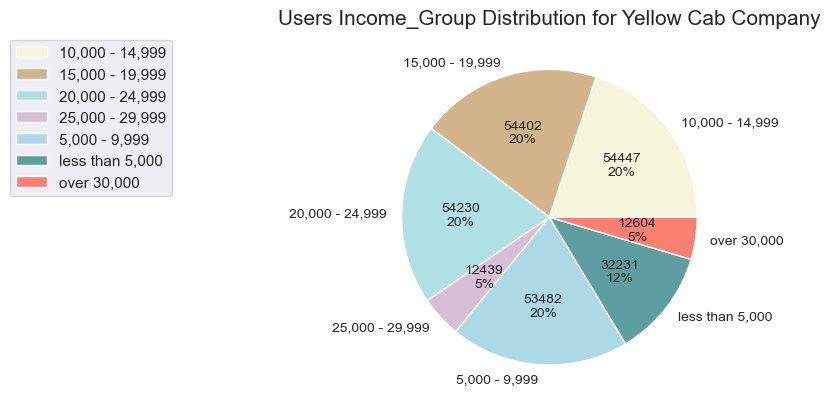

In [144]:
# Aggregating and plotting the Income_Group column
Yellow_Cab_df.groupby('Income_Group').count().plot(kind = 'pie',
                                                      autopct = labels_yellow,
                                                      textprops = {'fontsize':10},
                                                      colors = ['beige', 'tan',
                                                               'powderblue', 'thistle',
                                                              'lightblue', 'cadetblue', 'salmon'],
                                               y = 'Monthly_Income', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Users Income_Group Distribution for Yellow Cab Company', loc='center', fontsize=15)
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

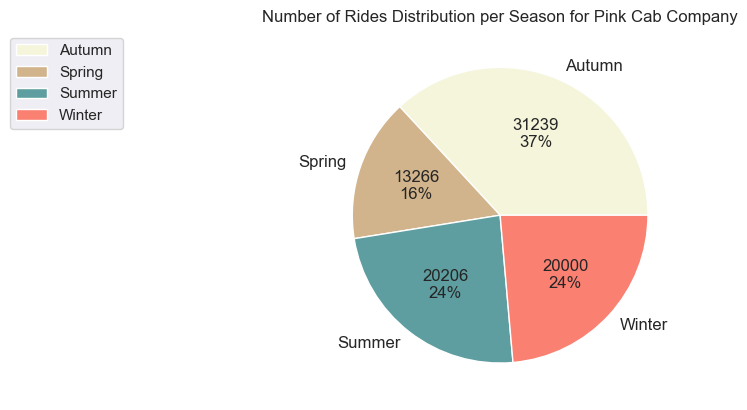

In [145]:
# Aggregating and plotting the Season column
Pink_Cab_df.groupby('Season').count().plot(kind = 'pie',
                                                      autopct = labels_pink,
                                                      textprops = {'fontsize':12},
                                                      colors = ['beige', 'tan', 
                                                                'cadetblue', 'salmon'],
                                               y = 'Month', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Number of Rides Distribution per Season for Pink Cab Company', loc='center')
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

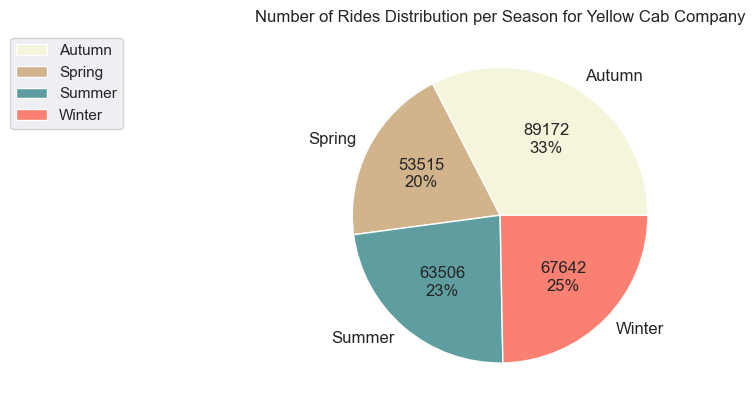

In [146]:
# Aggregating and plotting the Season column
Yellow_Cab_df.groupby('Season').count().plot(kind = 'pie',
                                                      autopct = labels_yellow,
                                                      textprops = {'fontsize':12},
                                                      colors = ['beige', 'tan', 
                                                                'cadetblue', 'salmon'],
                                               y = 'Month', ylabel='')

location = 0
legend_drawn_flag = True
plt.title('Number of Rides Distribution per Season for Yellow Cab Company', loc='center')
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
fig.set_size_inches(6,10)
plt.show();

In [147]:
# grouping desired data
gender_pink = Pink_Cab_df.groupby('Gender').Customer_ID.nunique()
gender_pink

Gender
Female    14819
Male      17511
Name: Customer_ID, dtype: int64

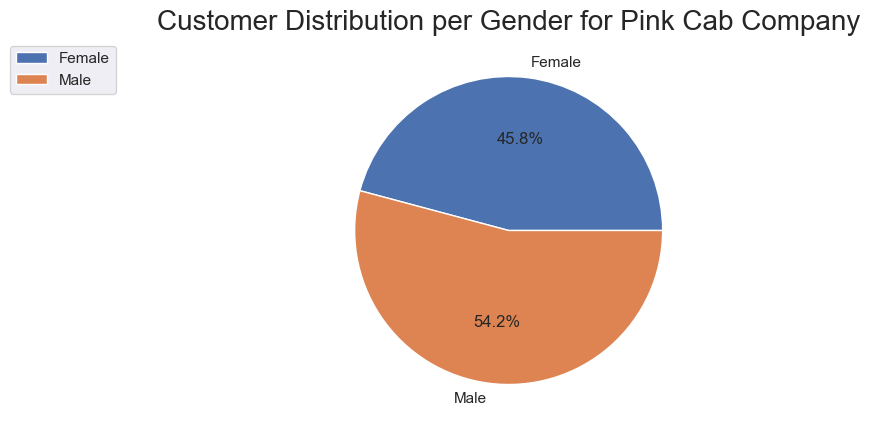

In [148]:
# Plotting grouped data
labelspink = gender_pink.index
valsuespink = gender_pink.values
figpink, axpink = plt.subplots(figsize=(10,5))
axpink.pie(valsuespink, labels=labelspink, autopct='%1.1f%%')
legend_drawn_flag = True
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
plt.title('Customer Distribution per Gender for Pink Cab Company',
         loc='center', fontsize=20)
plt.show();

In [149]:
# grouping desired data
gender_yellow = Yellow_Cab_df.groupby('Gender').Customer_ID.nunique()
gender_yellow

Gender
Female    18371
Male      21472
Name: Customer_ID, dtype: int64

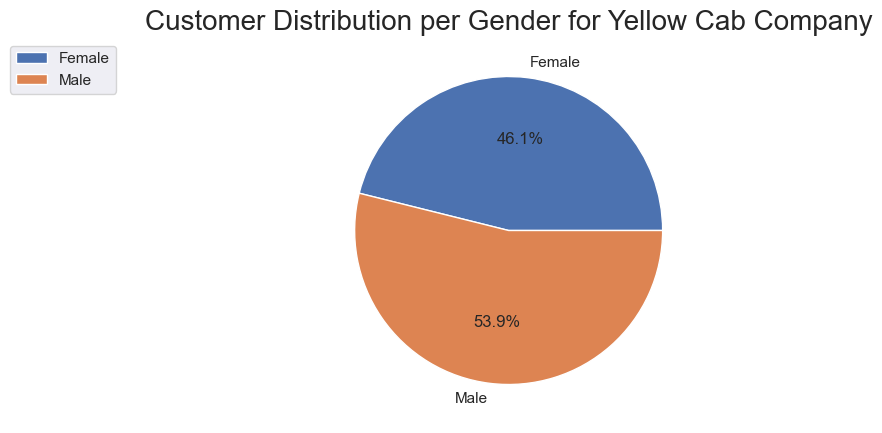

In [150]:
# Plotting grouped data
labelsyellow = gender_yellow.index
valuesyellow = gender_yellow.values
figyellow, axyellow = plt.subplots(figsize=(10,5))
axyellow.pie(valuesyellow, labels=labelsyellow, autopct='%1.1f%%')
legend_drawn_flag = True
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
plt.title('Customer Distribution per Gender for Yellow Cab Company',
          loc='center', fontsize=20)
plt.show();

In [151]:
# grouping desired data
income_lvl_pink = Pink_Cab_df.groupby('Income_Level').Customer_ID.nunique()
income_lvl_pink

Income_Level
High_Income       2988
Low_Income       12681
Middle_Income    16661
Name: Customer_ID, dtype: int64

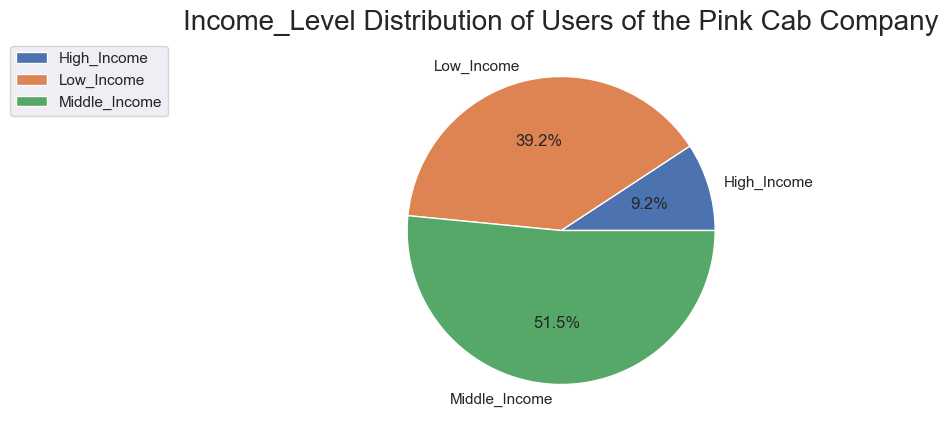

In [152]:
# Plotting grouped data
labspink = income_lvl_pink.index
valspink = income_lvl_pink.values
figpink, axpink = plt.subplots(figsize=(10,5))
axpink.pie(valspink, labels=labspink, autopct='%1.1f%%')
legend_drawn_flag = True
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
plt.title('Income_Level Distribution of Users of the Pink Cab Company',
         loc='center', fontsize=20)
plt.show();

In [153]:
# grouping desired data
income_lvl_yellow = Yellow_Cab_df.groupby('Income_Level').Customer_ID.nunique()
income_lvl_yellow

Income_Level
High_Income       3611
Low_Income       15753
Middle_Income    20479
Name: Customer_ID, dtype: int64

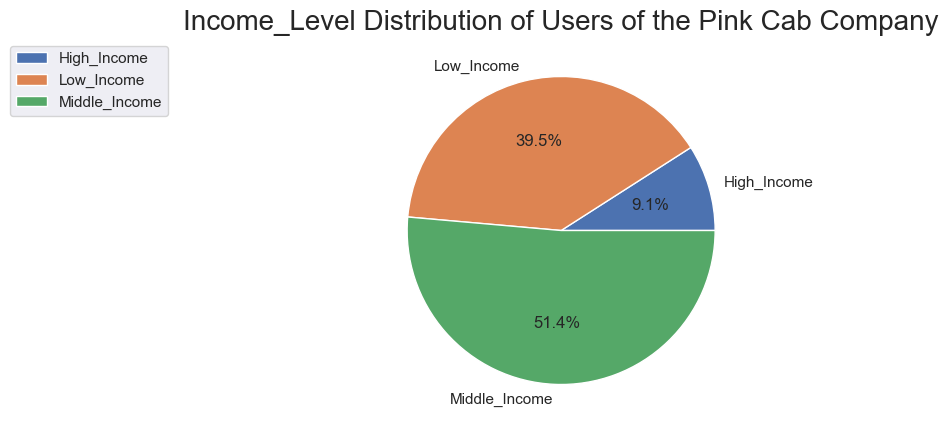

In [154]:
# Plotting grouped data
labsyellow = income_lvl_yellow.index
valsyellow = income_lvl_yellow.values
figpink, axpink = plt.subplots(figsize=(10,5))
axpink.pie(valsyellow, labels=labsyellow, autopct='%1.1f%%')
legend_drawn_flag = True
plt.legend(loc='best', bbox_to_anchor=(-0.5, 1))
plt.title('Income_Level Distribution of Users of the Pink Cab Company',
         loc='center', fontsize=20)
plt.show();

###### Boxplots

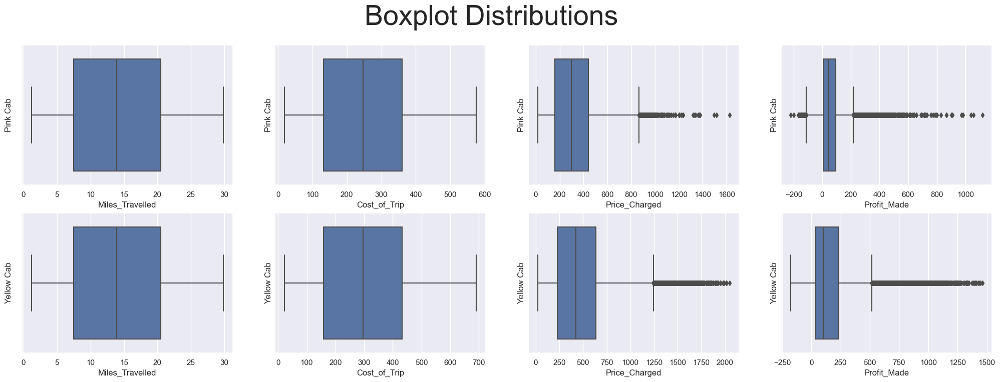

In [155]:
#Boxplots of the desired columns
fig,axes = plt.subplots(2, 4, figsize=(25, 8), sharey=True)
fig.suptitle('Boxplot Distributions', fontsize=40)

sns.boxplot(ax=axes[0,0], x='Miles_Travelled' ,     data=Pink_Cab_df).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,1], x='Cost_of_Trip'   ,     data=Pink_Cab_df).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,2], x='Price_Charged' ,        data=Pink_Cab_df).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,3], x='Profit_Made'   ,     data=Pink_Cab_df).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[1,0], x='Miles_Travelled' ,     data=Yellow_Cab_df).set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,1], x='Cost_of_Trip'   ,     data=Yellow_Cab_df).set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,2], x='Price_Charged' ,        data=Yellow_Cab_df).set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,3], x='Profit_Made'   ,     data=Yellow_Cab_df).set_ylabel("Yellow Cab");

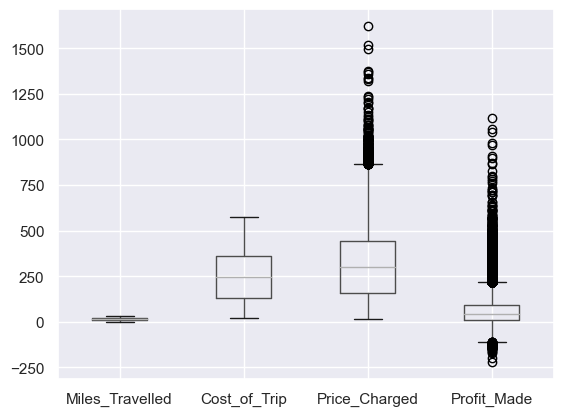

In [156]:
# Boxplots of desired data
Pink_Cab_df.boxplot(column=['Miles_Travelled', 'Cost_of_Trip', 'Price_Charged', 'Profit_Made']);

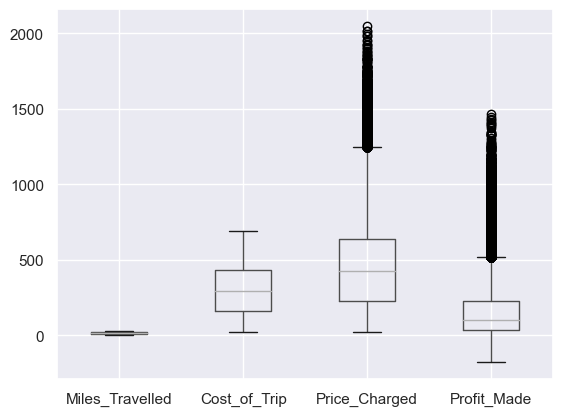

In [157]:
# Boxplots of desired data
Yellow_Cab_df.boxplot(column=['Miles_Travelled', 'Cost_of_Trip', 'Price_Charged', 'Profit_Made']);

###### Bar Charts

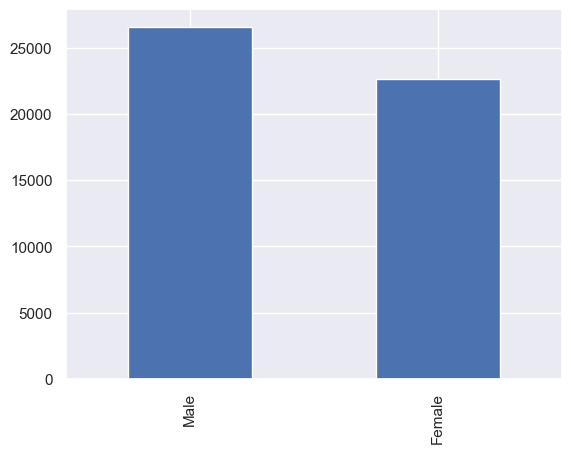

In [158]:
# Plotting bar chart
Customer_IDs['Gender'].value_counts().plot(kind='bar');

In [159]:
# Aggregating the data
pink_yr_percentage = Pink_Cab_df.groupby('Year')['Customer_ID'].nunique()
pink_yr_percentage = pink_yr_percentage.pct_change().mul(100).round(2)
pink_yr_percentage

Year
2016     NaN
2017    11.9
2018    -1.3
Name: Customer_ID, dtype: float64

In [160]:
# Aggregating the data
yellow_yr_percentage = Yellow_Cab_df.groupby('Year')['Customer_ID'].nunique()
yellow_yr_percentage = yellow_yr_percentage.pct_change().mul(100).round(2)
yellow_yr_percentage

Year
2016     NaN
2017    7.14
2018   -1.60
Name: Customer_ID, dtype: float64

In [161]:
# Grouping data
yearly_customer_growth_p = Pink_Cab_df.groupby('Year')['Customer_ID'].nunique()
yearly_customer_growth_p = pink_yr_percentage.pct_change().mul(100).round(2)
yearly_customer_growth_p

Year
2016       NaN
2017       NaN
2018   -110.92
Name: Customer_ID, dtype: float64

In [162]:
# Grouping data
yearly_customer_growth_y = Yellow_Cab_df.groupby('Year')['Customer_ID'].nunique()
yearly_customer_growth_y = yellow_yr_percentage.pct_change().mul(100).round(2)
yearly_customer_growth_y

Year
2016       NaN
2017       NaN
2018   -122.41
Name: Customer_ID, dtype: float64

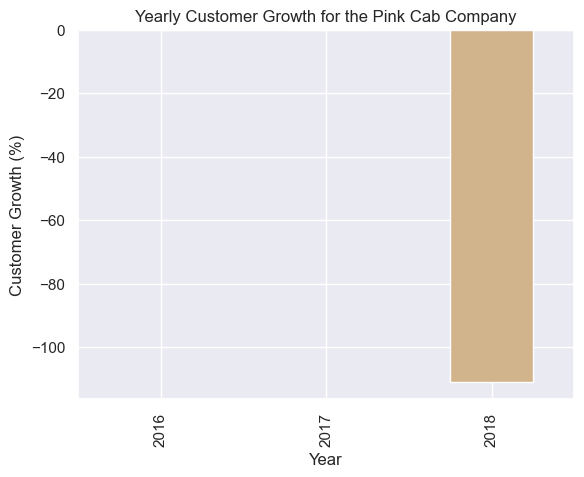

In [163]:
# Plotting grouped data
yearly_customer_growth_p.plot(kind='bar', color = 'tan')

plt.title('Yearly Customer Growth for the Pink Cab Company')
plt.ylabel('Customer Growth (%)')
plt.xlabel('Year')
plt.show();

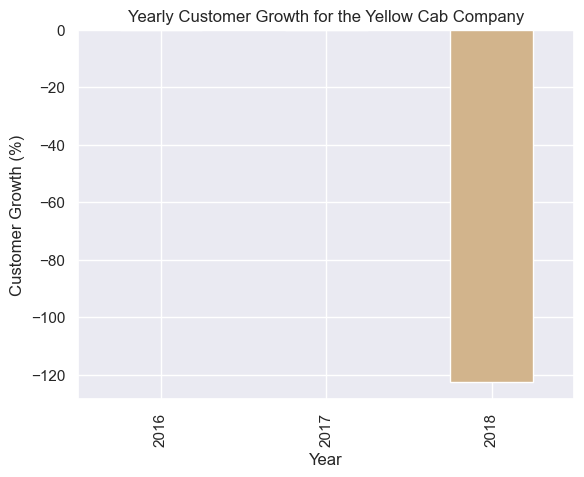

In [164]:
# Plotting grouped data
yearly_customer_growth_y.plot(kind='bar', color = 'tan')

plt.title('Yearly Customer Growth for the Yellow Cab Company')
plt.ylabel('Customer Growth (%)')
plt.xlabel('Year')
plt.show();

The graphs above are upside down (from top to down) because of the presence of negative values

In [165]:
# Grouping data
returning_customers = Master_Data.groupby(['Company'])['User_returned'].value_counts().unstack().fillna(0)
returning_customers

User_returned,1,2,3,4,5,6,7,8,9,10,...,43,44,45,46,47,48,49,50,51,53
Company,,,,,,,,,,,,,,,,,,,,,
Pink Cab,4667,5902,5209,3900,2992,2514,2503,2374,2397,2202,...,299,208,142,83,123,54,18,39,7,19
Yellow Cab,6786,9788,9554,7264,5048,4410,4392,4802,5487,6148,...,1722,1112,803,561,770,330,129,261,44,87


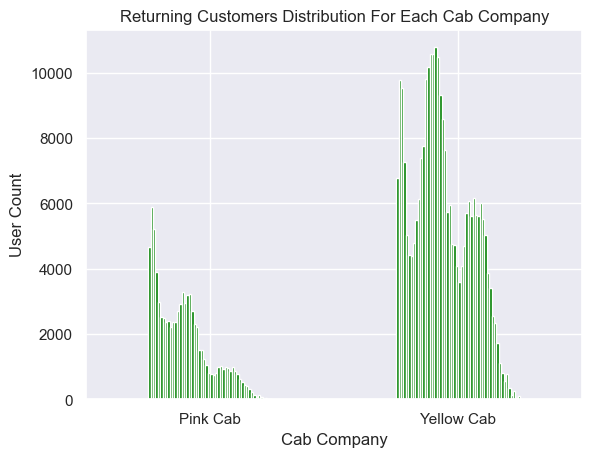

In [166]:
# Plotting grouped data
returning_customers.plot(kind='bar', stacked = False, color = ['green'])
plt.title('Returning Customers Distribution For Each Cab Company')
plt.xticks(rotation=0, ha='center')
plt.xlabel('Cab Company')
plt.ylabel('User Count')
plt.legend().set_visible(False)
plt.show();

In [167]:
# Grouping data
pink_pl = Pink_Cab_df.groupby(['Month']).Transaction_ID.count()
pink_pl

Month
1      5057
2      3375
3      4223
4      4083
5      4960
6      5877
7      6590
8      7739
9      9658
10    10576
11    11005
12    11568
Name: Transaction_ID, dtype: int64

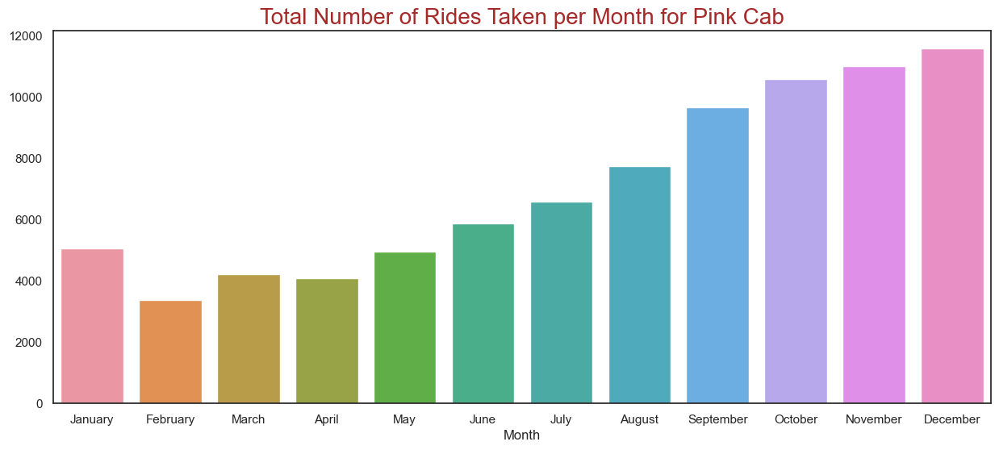

In [168]:
# Plotting grouped data
plt.figure(figsize=(15,6))
sns.set_style(style='white')
axp = sns.barplot(x=pink_pl.index, y=pink_pl.values)

axp.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11))
axp.set_xticklabels(('January','February', 'March', 
                    'April', 'May', 'June', 'July', 
                    'August','September', 'October', 
                    'November', 'December'))

plt.title('Total Number of Rides Taken per Month for Pink Cab', fontsize=20, color='Brown')
plt.show();

In [169]:
# Aggregating data
yellow_plot = Yellow_Cab_df.groupby(['Month']).Transaction_ID.count()
yellow_plot

Month
1     17298
2     14932
3     17423
4     17351
5     18741
6     18836
7     21086
8     23584
9     27201
10    30276
11    31695
12    35412
Name: Transaction_ID, dtype: int64

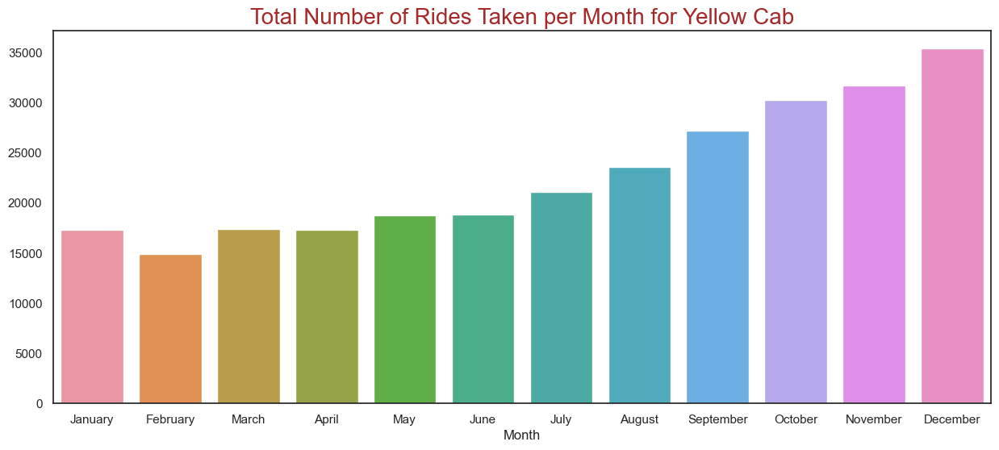

In [170]:
# Plotting grouped data
plt.figure(figsize=(15,6))
sns.set_style(style='white')
axy = sns.barplot(x=yellow_plot.index, y=yellow_plot.values)
axy.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11))
axy.set_xticklabels(('January','February', 'March', 
                    'April', 'May', 'June', 'July', 
                    'August','September', 'October', 
                    'November', 'December'))

plt.title('Total Number of Rides Taken per Month for Yellow Cab', fontsize=20, color='Brown')
plt.show();

In [171]:
# Aggregating data
holiday_pink = Pink_Cab_df.groupby(['Holiday']).Transaction_ID.count()
holiday_pink

Holiday
0                     71960
April Fools Day          84
Boxing Day              226
Christmas Day           337
Halloween               208
Independence Day        108
Juneteenth Day          172
May Day                 141
New Year Day            294
New year Eve          10877
Saint Nicholas Day      304
Name: Transaction_ID, dtype: int64

In [172]:
# Aggregating data
pink_quarter = Pink_Cab_df.groupby(['Quarter']).Transaction_ID.count()
pink_quarter

Quarter
1    12655
2    14920
3    23987
4    33149
Name: Transaction_ID, dtype: int64

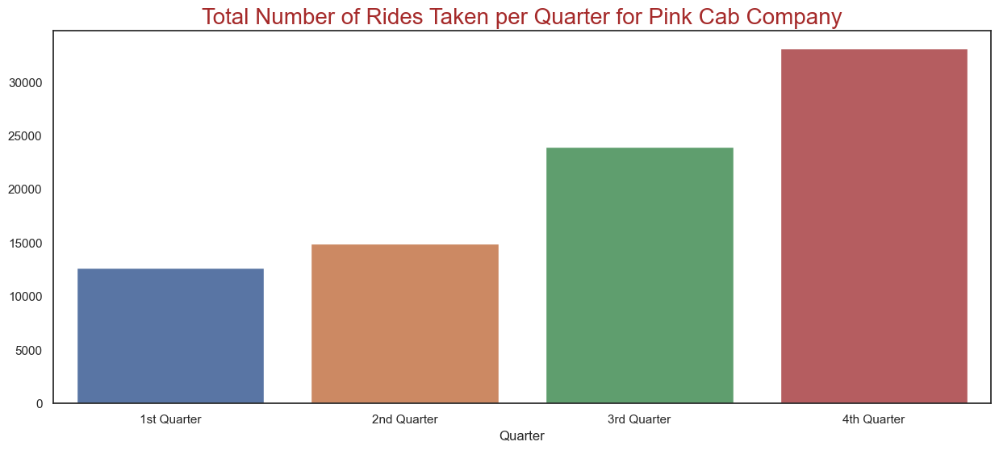

In [173]:
# Plotting grouped data
plt.figure(figsize=(15,6))
sns.set_style(style='white')
axy = sns.barplot(x=pink_quarter.index, y=pink_quarter.values)
axy.set_xticks((0,1,2,3))
axy.set_xticklabels(('1st Quarter','2nd Quarter', '3rd Quarter', 
                    '4th Quarter'))
plt.title('Total Number of Rides Taken per Quarter for Pink Cab Company', fontsize=20, color='Brown')
plt.show();  

In [174]:
# Aggregating data
yellow_quarter = Pink_Cab_df.groupby(['Quarter']).Transaction_ID.count()
yellow_quarter

Quarter
1    12655
2    14920
3    23987
4    33149
Name: Transaction_ID, dtype: int64

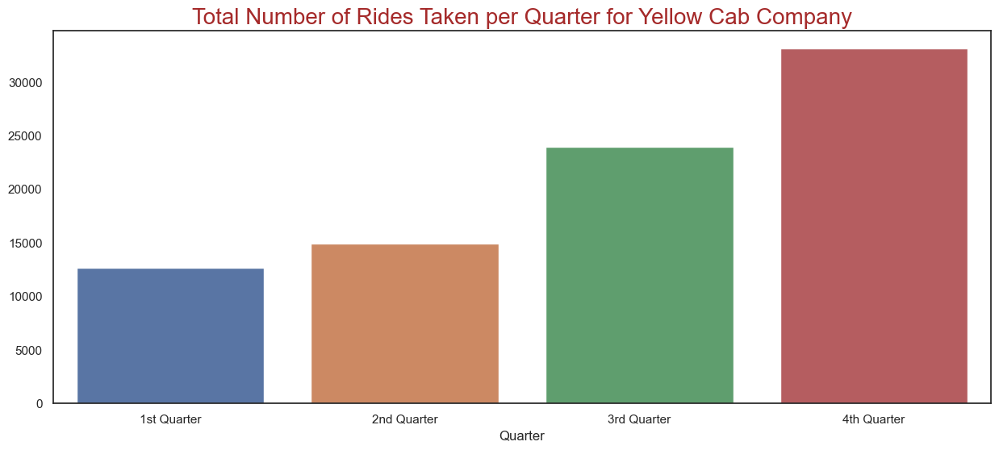

In [175]:
# Plotting grouped data
plt.figure(figsize=(15,6))
sns.set_style(style='white')
axy = sns.barplot(x=yellow_quarter.index, y=yellow_quarter.values)
axy.set_xticks((0,1,2,3))
axy.set_xticklabels(('1st Quarter','2nd Quarter', '3rd Quarter', 
                    '4th Quarter'))
plt.title('Total Number of Rides Taken per Quarter for Yellow Cab Company', fontsize=20, color='Brown')
plt.show();

In [176]:
# Aggregating data
daily_cab_usage = Master_Data.groupby(['Weekday', 'Company'])['Transaction_ID'].nunique().unstack().fillna(0)
daily_cab_usage

Company,Pink Cab,Yellow Cab
Weekday,,
0,7032,22608
1,7077,22687
2,7076,22947
3,9549,30079
4,19249,61884
5,18253,59869
6,16475,53761


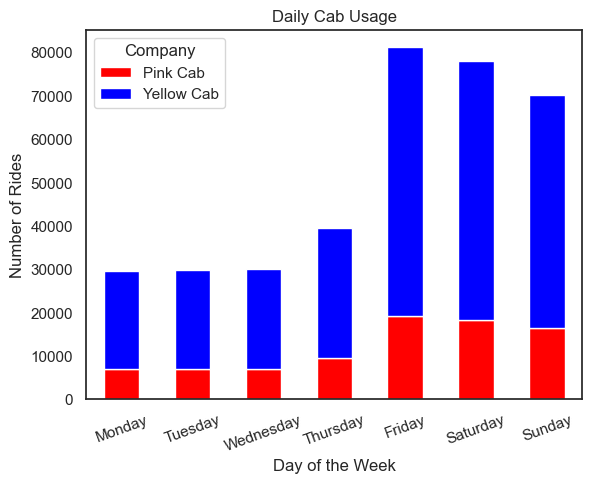

In [177]:
# Plotting grouped data
axd = daily_cab_usage.plot(kind='bar',
                  stacked=True,
                  color = ['red', 'blue'])
axd.set_xticks((0,1,2,3,4,5,6))
axd.set_xticklabels(('Monday','Tuesday', 'Wednesday', 
                    'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.title('Daily Cab Usage')
plt.xticks(rotation=20, ha='center')

plt.xlabel('Day of the Week')
plt.ylabel('Number of Rides')
plt.show();

In [178]:
# Aggregating data
holiday_pink = Pink_Cab_df.groupby(['Holiday']).Transaction_ID.count()
holiday_pink

Holiday
0                     71960
April Fools Day          84
Boxing Day              226
Christmas Day           337
Halloween               208
Independence Day        108
Juneteenth Day          172
May Day                 141
New Year Day            294
New year Eve          10877
Saint Nicholas Day      304
Name: Transaction_ID, dtype: int64

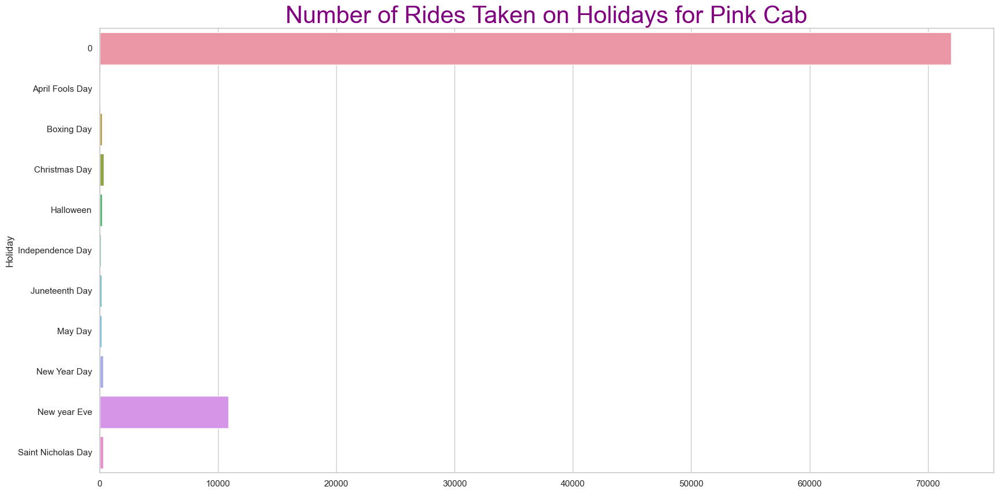

In [179]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='whitegrid')
axp = sns.barplot(x=holiday_pink.values, y=holiday_pink.index, orient='h')
plt.title('Number of Rides Taken on Holidays for Pink Cab', fontsize=30, color='Purple')
plt.show();

In [180]:
# Aggregating data
holiday_yellow = Yellow_Cab_df.groupby(['Holiday']).Transaction_ID.count()
holiday_yellow

Holiday
0                     223829
April Fools Day          406
Boxing Day               596
Christmas Day            994
Halloween                606
Independence Day         339
Juneteenth Day           575
May Day                  590
New Year Day             942
New year Eve           43814
Saint Nicholas Day      1144
Name: Transaction_ID, dtype: int64

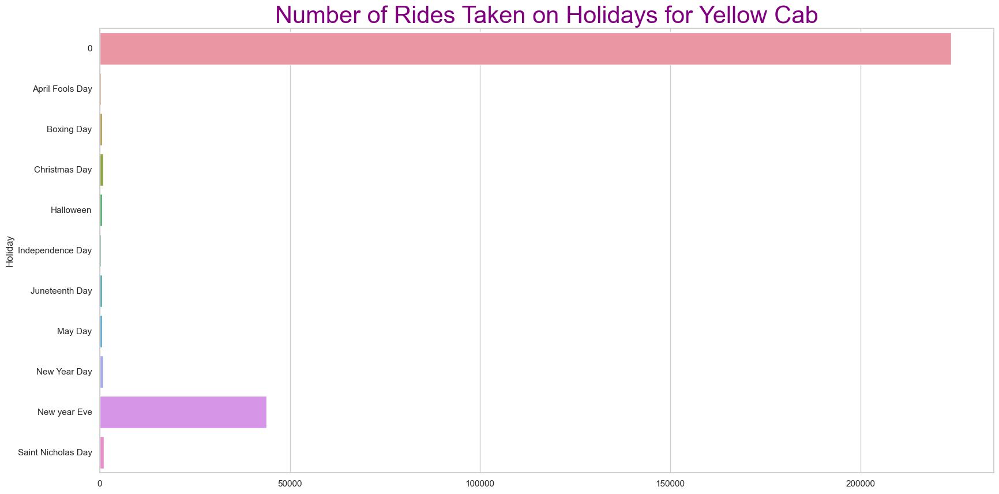

In [181]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='whitegrid')
axy = sns.barplot(x=holiday_yellow.values, y=holiday_yellow.index, orient='h')
plt.title('Number of Rides Taken on Holidays for Yellow Cab', fontsize=30, color='Purple')
plt.show();

The value 0 represented as a category in the graphs above represents unassigned dates

In [182]:
# Aggregating data
cities_pink = Pink_Cab_df.groupby(['City']).Transaction_ID.count()
cities_pink

City
ATLANTA GA         1762
AUSTIN TX          1868
BOSTON MA          5186
CHICAGO IL         9361
DALLAS TX          1380
DENVER CO          1394
LOS ANGELES CA    19865
MIAMI FL           2002
NASHVILLE TN       1841
NEW YORK NY       13967
ORANGE COUNTY      1513
PHOENIX AZ          864
PITTSBURGH PA       682
SACRAMENTO CA      1334
SAN DIEGO CA      10672
SEATTLE WA         2732
SILICON VALLEY     3797
TUCSON AZ           799
WASHINGTON DC      3692
Name: Transaction_ID, dtype: int64

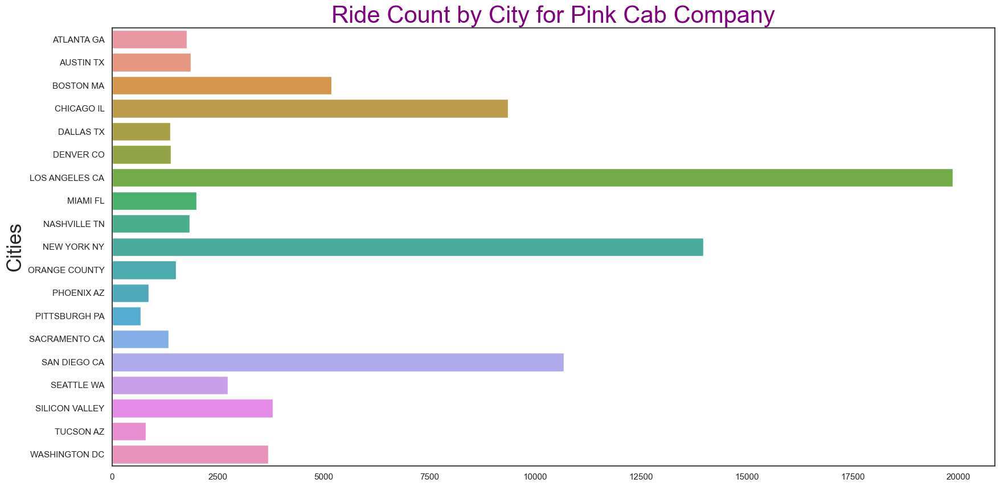

In [183]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='white')
axpink = sns.barplot(x=cities_pink.values, y=cities_pink.index, orient='h')
plt.title('Ride Count by City for Pink Cab Company', fontsize=30, color='Purple')
plt.ylabel("Cities", fontsize=25)
plt.show();

In [184]:
# Aggregating data
cities_yellow = Yellow_Cab_df.groupby(['City']).Transaction_ID.count()
cities_yellow

City
ATLANTA GA         5795
AUSTIN TX          3028
BOSTON MA         24506
CHICAGO IL        47264
DALLAS TX          5637
DENVER CO          2431
LOS ANGELES CA    28168
MIAMI FL           4452
NASHVILLE TN       1169
NEW YORK NY       85514
ORANGE COUNTY      2442
PHOENIX AZ         1189
PITTSBURGH PA       625
SACRAMENTO CA      1022
SAN DIEGO CA       9733
SEATTLE WA         5231
SILICON VALLEY     4690
TUCSON AZ          1122
WASHINGTON DC     39817
Name: Transaction_ID, dtype: int64

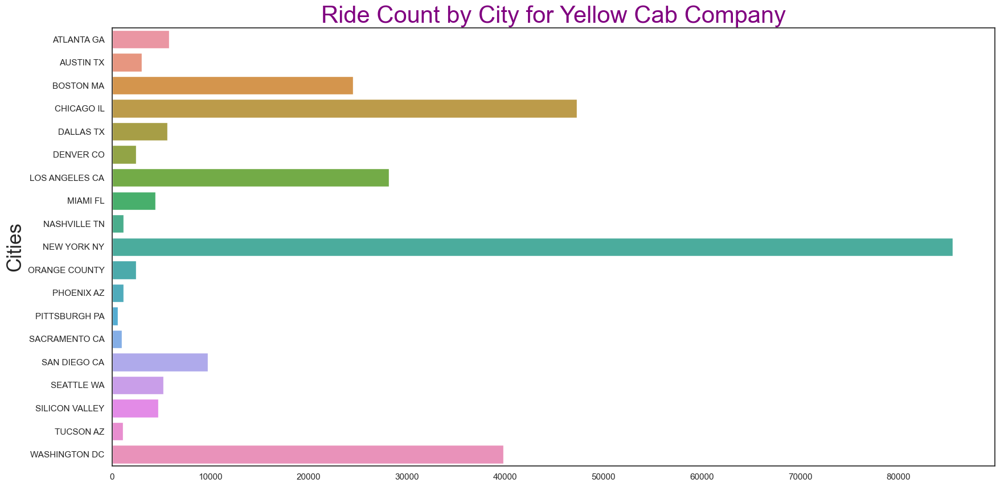

In [185]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='white')
axpink = sns.barplot(x=cities_yellow.values, y=cities_yellow.index, orient='h')
plt.title('Ride Count by City for Yellow Cab Company', fontsize=30, color='Purple')
plt.ylabel("Cities", fontsize=25)
plt.show();

In [186]:
cities_custp = Pink_Cab_df.groupby(['City']).Customer_ID.nunique()
cities_custp

City
ATLANTA GA        1322
AUSTIN TX         1354
BOSTON MA         2463
CHICAGO IL        2859
DALLAS TX         1118
DENVER CO         1145
LOS ANGELES CA    2996
MIAMI FL          1480
NASHVILLE TN      1356
NEW YORK NY       2972
ORANGE COUNTY     1198
PHOENIX AZ         763
PITTSBURGH PA      604
SACRAMENTO CA     1078
SAN DIEGO CA      2909
SEATTLE WA        1790
SILICON VALLEY    2130
TUCSON AZ          684
WASHINGTON DC     2109
Name: Customer_ID, dtype: int64

Text(0, 0.5, 'Cities')

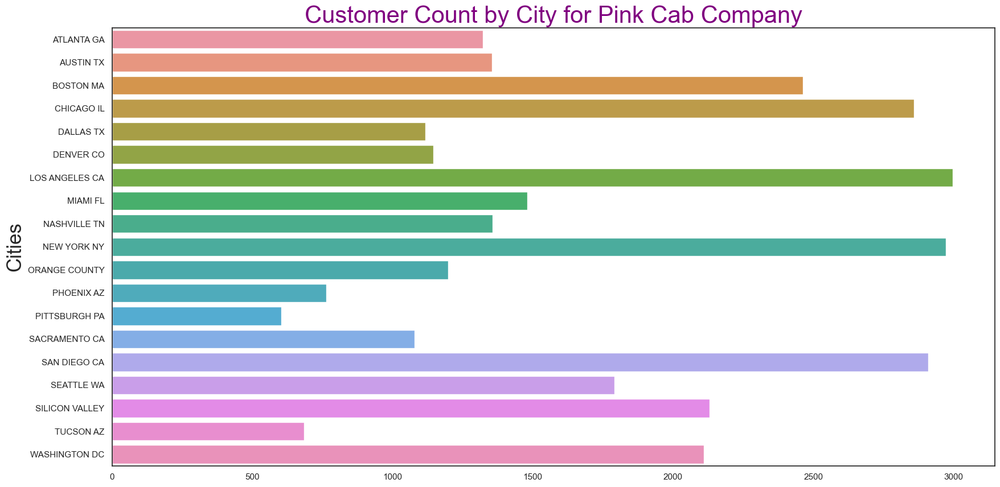

In [187]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='white')
axpink = sns.barplot(x=cities_custp.values, y=cities_custp.index, orient='h')
plt.title('Customer Count by City for Pink Cab Company', fontsize=30, color='Purple')
plt.ylabel("Cities", fontsize=25)

In [188]:
cities_custy = Yellow_Cab_df.groupby(['City']).Customer_ID.nunique()
cities_custy

City
ATLANTA GA        2595
AUSTIN TX         1914
BOSTON MA         2997
CHICAGO IL        3000
DALLAS TX         2564
DENVER CO         1681
LOS ANGELES CA    2998
MIAMI FL          2334
NASHVILLE TN       965
NEW YORK NY       3000
ORANGE COUNTY     1700
PHOENIX AZ         988
PITTSBURGH PA      568
SACRAMENTO CA      873
SAN DIEGO CA      2881
SEATTLE WA        2479
SILICON VALLEY    2377
TUCSON AZ          929
WASHINGTON DC     3000
Name: Customer_ID, dtype: int64

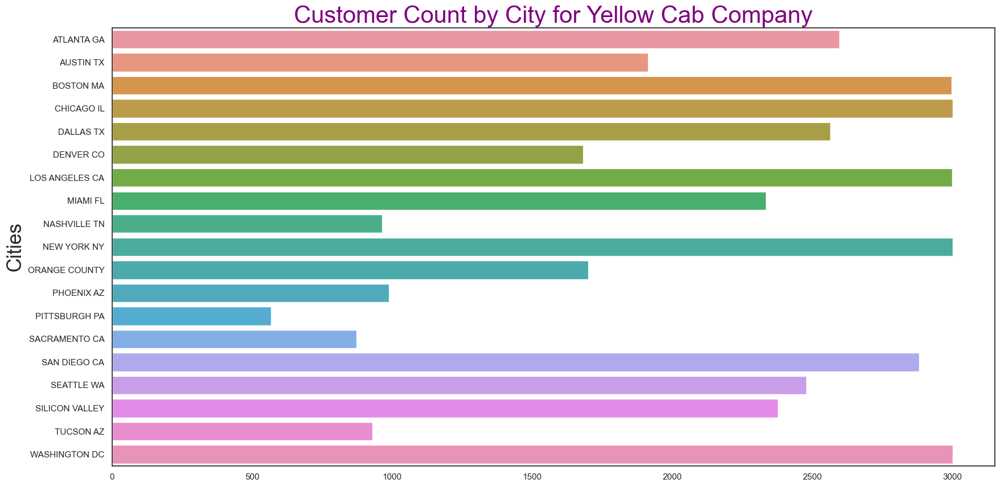

In [189]:
# Plotting grouped data
plt.figure(figsize=(20,10))
sns.set_style(style='white')
axpink = sns.barplot(x=cities_custy.values, y=cities_custy.index, orient='h')
plt.title('Customer Count by City for Yellow Cab Company', fontsize=30, color='Purple')
plt.ylabel("Cities", fontsize=25)
plt.show();

In [190]:
# Aggregating data
pink_monthly_profit = Pink_Cab_df.groupby(['Month'])['Profit_Made'].sum()
pink_monthly_profit

Month
1      388054.76
2      252041.47
3      299096.62
4      245817.95
5      168614.02
6      232715.31
7      301884.81
8      388251.25
9      494435.45
10     696437.07
11     810326.46
12    1029653.34
Name: Profit_Made, dtype: float64

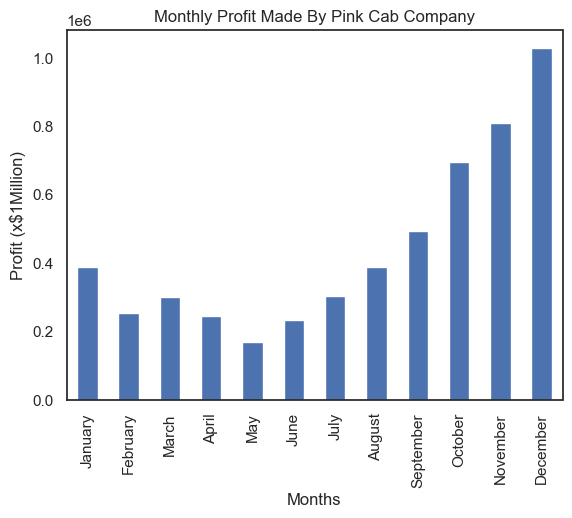

In [191]:
# Plotting grouped data
axpnk = pink_monthly_profit.plot(kind='bar')
axpnk.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11))
axpnk.set_xticklabels(('January','February', 'March', 
                    'April', 'May', 'June', 'July', 
                    'August','September', 'October', 
                    'November', 'December'))
plt.xlabel('Months')
plt.ylabel('Profit (x$1Million)')
plt.title('Monthly Profit Made By Pink Cab Company')
plt.show();

In [192]:
yellow_monthly_profit = Yellow_Cab_df.groupby(['Month'])['Profit_Made'].sum()
yellow_monthly_profit

Month
1     3262704.11
2     2975978.67
3     3151215.04
4     3075542.36
5     3983543.47
6     3580338.31
7     2861561.71
8     2856270.77
9     4142382.96
10    4250511.02
11    4609321.33
12    5172477.51
Name: Profit_Made, dtype: float64

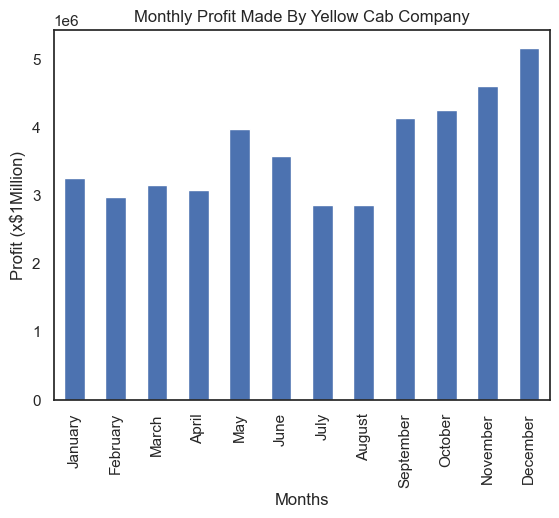

In [193]:
# Plotting grouped data
axyel = yellow_monthly_profit.plot(kind='bar')
axyel.set_xticks((0,1,2,3,4,5,6,7,8,9,10,11))
axyel.set_xticklabels(('January','February', 'March', 
                    'April', 'May', 'June', 'July', 
                    'August','September', 'October', 
                    'November', 'December'))
plt.xlabel('Months')
plt.ylabel('Profit (x$1Million)')
plt.title('Monthly Profit Made By Yellow Cab Company')
plt.show()

In [194]:
# Aggregating data
profit_margin = Master_Data.groupby(['Year', 'Company'])['Profit_Percentage'].mean().unstack()
profit_margin = profit_margin.pct_change().mul(100).round(2)
profit_margin

Company,Pink Cab,Yellow Cab
Year,,
2016,NaN,NaN
2017,-2.77,0.14
2018,-13.43,-10.17


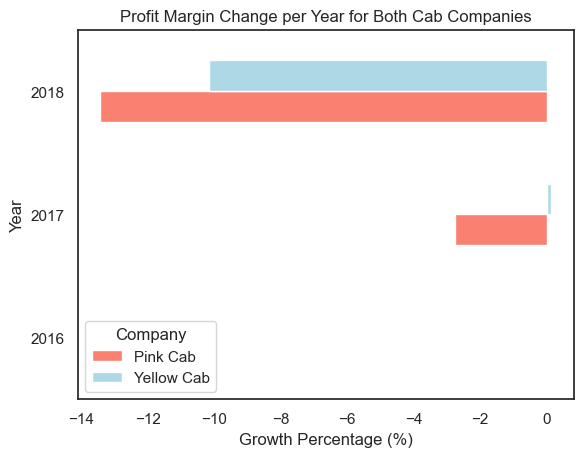

In [195]:
# Plotting grouped data
profit_margin.plot(kind='barh',
                    stacked=False,
                    color = ['salmon','lightblue'])

plt.title('Profit Margin Change per Year for Both Cab Companies')
plt.xlabel('Growth Percentage (%)')
plt.ylabel('Year')
plt.show();

The graph above moves from right to left because of the presence of negative values in the data that
has been plotted

In [196]:
# Aggregating data
pink_daily_profit = Pink_Cab_df.groupby(['Weekday'])['Profit_Made'].mean()
pink_daily_profit

Weekday
0    47.292393
1    47.891111
2    47.620731
3    47.068226
4    69.260184
5    67.687880
6    77.737668
Name: Profit_Made, dtype: float64

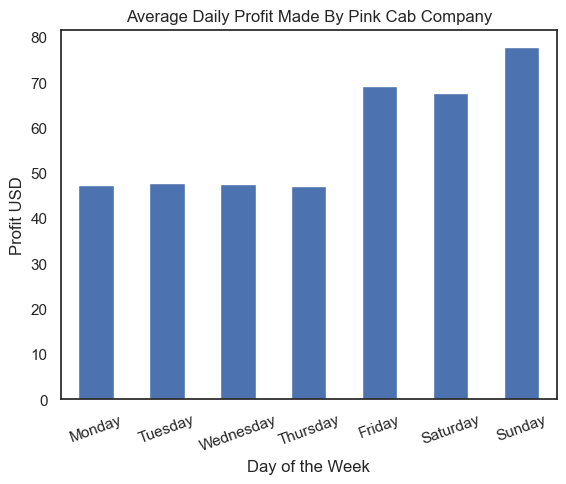

In [197]:
# Plotting grouped data
axpk = pink_daily_profit.plot(kind='bar')
axpk.set_xticks((0,1,2,3,4,5,6))
axpk.set_xticklabels(('Monday','Tuesday', 'Wednesday', 
                    'Thursday', 'Friday', 'Saturday', 'Sunday'))

plt.title('Average Daily Profit Made By Pink Cab Company')
plt.xticks(rotation=20, ha='center')
plt.xlabel('Day of the Week')
plt.ylabel('Profit USD')
plt.show();

In [198]:
# Aggregating data
yellow_daily_profit = Yellow_Cab_df.groupby(['Weekday'])['Profit_Made'].mean()
yellow_daily_profit

Weekday
0    139.820814
1    139.664849
2    138.063246
3    137.259843
4    169.897674
5    167.549833
6    181.366365
Name: Profit_Made, dtype: float64

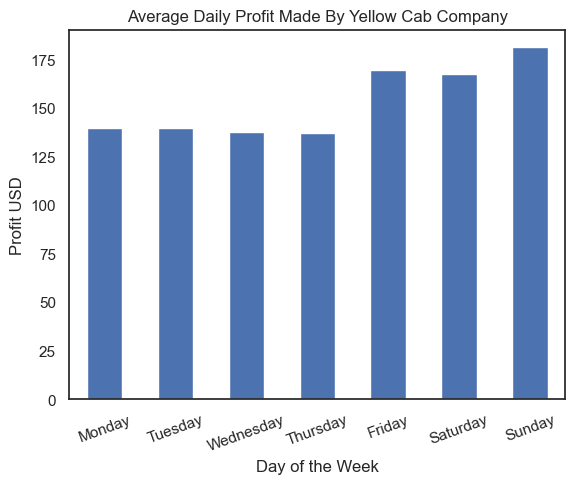

In [199]:
# Plotting grouped data
axyl = yellow_daily_profit.plot(kind='bar')
axyl.set_xticks((0,1,2,3,4,5,6))
axyl.set_xticklabels(('Monday','Tuesday', 'Wednesday', 
                    'Thursday', 'Friday', 'Saturday', 'Sunday'))
plt.title('Average Daily Profit Made By Yellow Cab Company')
plt.xticks(rotation=20, ha='center')
plt.xlabel('Day of the Week')
plt.ylabel('Profit USD')
plt.show();

###### Line Charts

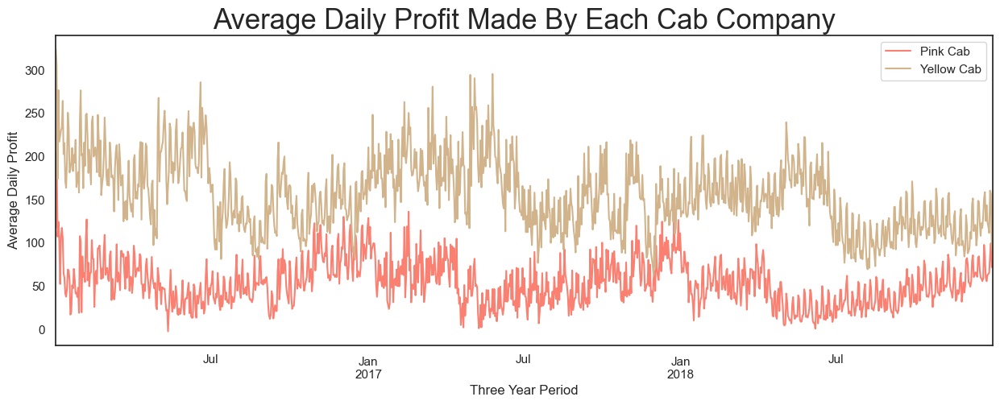

In [200]:
# Aggregating and plotting data
pink_daily_avg = Pink_Cab_df.groupby('Date_of_Travel')['Profit_Made'].mean()
yellow_daily_avg = Yellow_Cab_df.groupby('Date_of_Travel')['Profit_Made'].mean()

plt.subplots(1,1, figsize= (15,5))
pink_daily_avg.plot(color = "salmon")
yellow_daily_avg .plot(color = "tan")
plt.legend(['Pink Cab','Yellow Cab'])
plt.xlabel('Three Year Period')
plt.ylabel('Average Daily Profit')
plt.title('Average Daily Profit Made By Each Cab Company', fontsize=25)
plt.show();

In [201]:
# Aggregating data
pink_profit_sum = Pink_Cab_df.groupby('Date_of_Travel')['Profit_Made'].sum()
pink_profit_sum

Date_of_Travel
2016-01-02     4809.42
2016-01-03    10620.62
2016-01-04      428.59
2016-01-05      745.36
2016-01-06     2336.97
                ...   
2018-12-27     4299.15
2018-12-28    18478.89
2018-12-29    19399.97
2018-12-30     4019.06
2018-12-31     4444.15
Name: Profit_Made, Length: 1095, dtype: float64

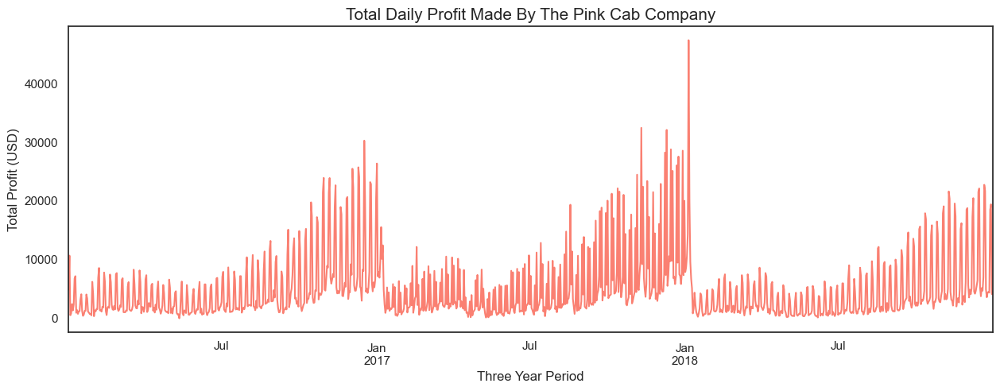

In [202]:
# Plotting grouped data
plt.figure(figsize= (15,5))
pink_profit_sum.plot(color = "salmon")
plt.xlabel('Three Year Period')
plt.ylabel('Total Profit (USD)')
plt.title('Total Daily Profit Made By The Pink Cab Company', fontsize=15)
plt.show();

In [203]:
# Aggregating data
yellow_profit_sum = Yellow_Cab_df.groupby('Date_of_Travel')['Profit_Made'].sum()
yellow_profit_sum

Date_of_Travel
2016-01-02     45295.63
2016-01-03     38449.46
2016-01-04      3650.22
2016-01-05     11338.13
2016-01-06     18663.43
                ...    
2018-12-27     28057.65
2018-12-28    100411.40
2018-12-29     98813.91
2018-12-30     19574.13
2018-12-31     14993.73
Name: Profit_Made, Length: 1095, dtype: float64

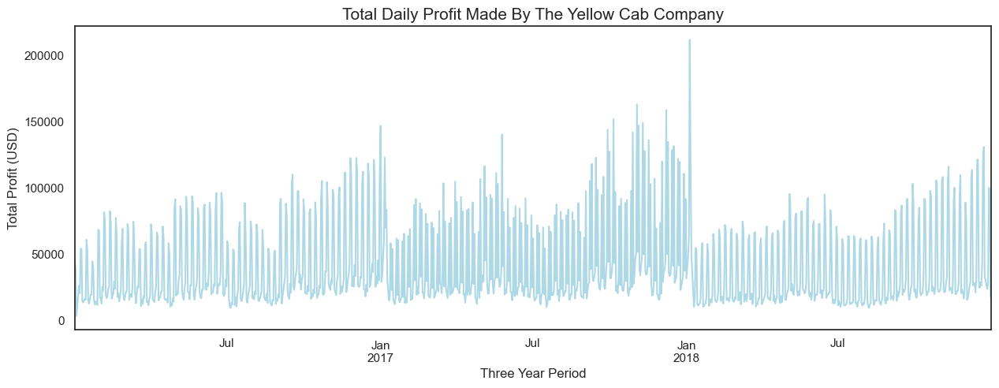

In [204]:
# Plotting grouped data
plt.figure(figsize= (15,5))
yellow_profit_sum.plot(color = "lightblue")
plt.xlabel('Three Year Period')
plt.ylabel('Total Profit (USD)')
plt.title('Total Daily Profit Made By The Yellow Cab Company', fontsize=15)
plt.show();

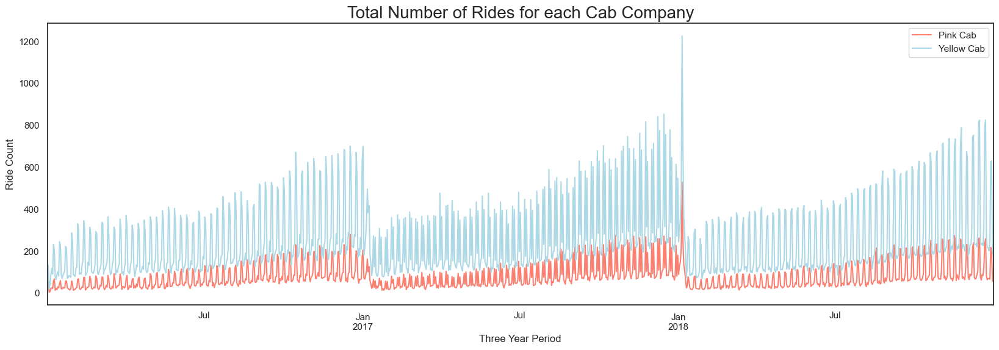

In [205]:
# Aggregating and plotting data
pink_rides_yr = Pink_Cab_df.groupby('Date_of_Travel')['Transaction_ID'].nunique()
yellow_rides_yr = Yellow_Cab_df.groupby('Date_of_Travel')['Transaction_ID'].nunique()

plt.subplots(1,1, figsize= (20,6))
pink_rides_yr.plot(kind = 'line', color = "salmon")
yellow_rides_yr.plot(kind = 'line', color = "lightblue")
plt.legend(['Pink Cab','Yellow Cab'])
plt.xlabel('Three Year Period')
plt.ylabel('Ride Count')
plt.title('Total Number of Rides for each Cab Company', fontsize=20)
plt.show();

In [206]:
# Grouping data
pink_customers_yr = Pink_Cab_df.groupby(['Year'])['Customer_ID'].nunique()
pink_customers_yr

Year
2016    16661
2017    18643
2018    18400
Name: Customer_ID, dtype: int64

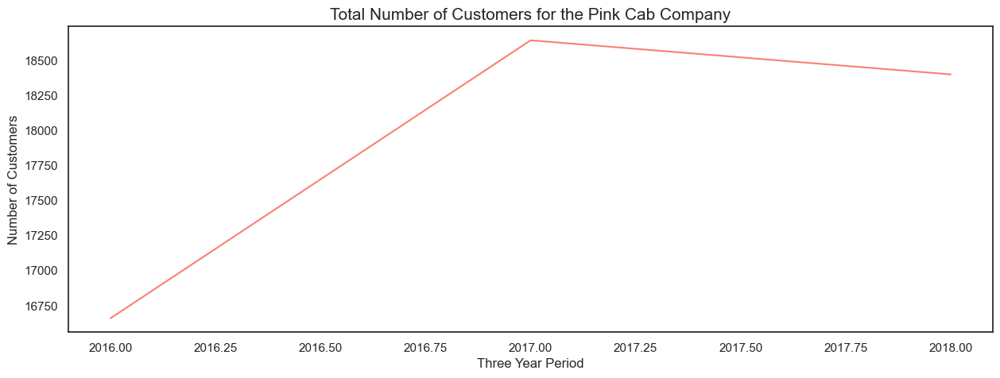

In [207]:
# Plotting grouped data
plt.figure(figsize= (15,5))
pink_customers_yr.plot(color = "salmon")
plt.xlabel('Three Year Period')
plt.ylabel('Number of Customers')
plt.title('Total Number of Customers for the Pink Cab Company', fontsize=15)
plt.show();

In [208]:
# Grouping data
yellow_customers_yr = Yellow_Cab_df.groupby(['Year'])['Customer_ID'].nunique()
yellow_customers_yr

Year
2016    25937
2017    27789
2018    27345
Name: Customer_ID, dtype: int64

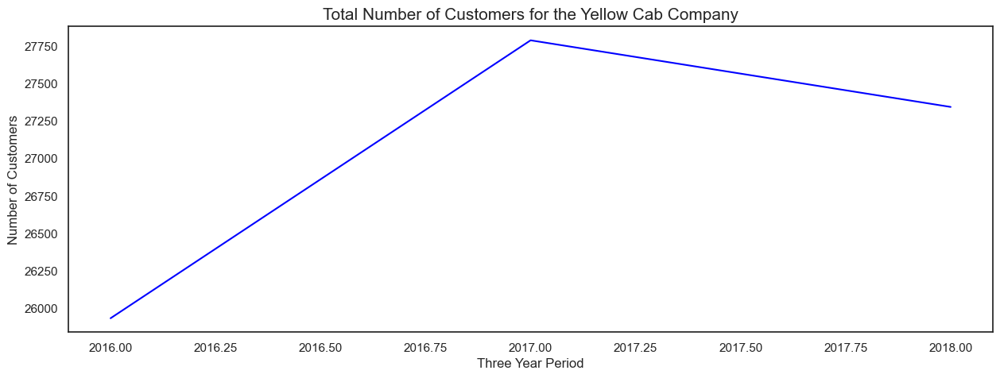

In [209]:
# Plotting grouped data
plt.figure(figsize= (15,5))
yellow_customers_yr.plot(color = "blue")
plt.xlabel('Three Year Period')
plt.ylabel('Number of Customers')
plt.title('Total Number of Customers for the Yellow Cab Company', fontsize=15)
plt.show();

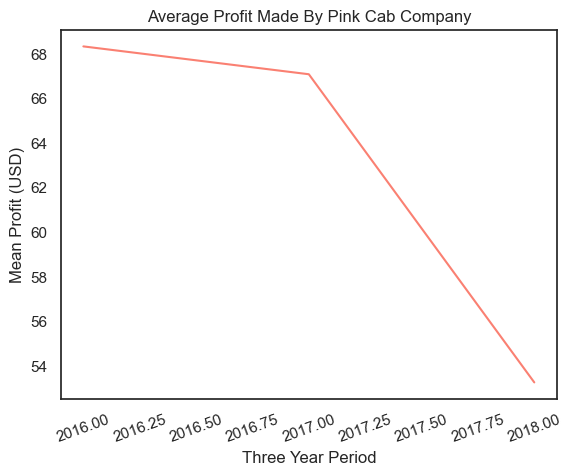

In [210]:
# Aggregating and plotting data
pink_yearly_avg = Pink_Cab_df.groupby('Year')['Profit_Made'].mean()

pink_yearly_avg.plot(color = "salmon")
plt.xlabel('Three Year Period')
plt.xticks(rotation=20, ha='center')
plt.ylabel('Mean Profit (USD)')
plt.title('Average Profit Made By Pink Cab Company')
plt.show();

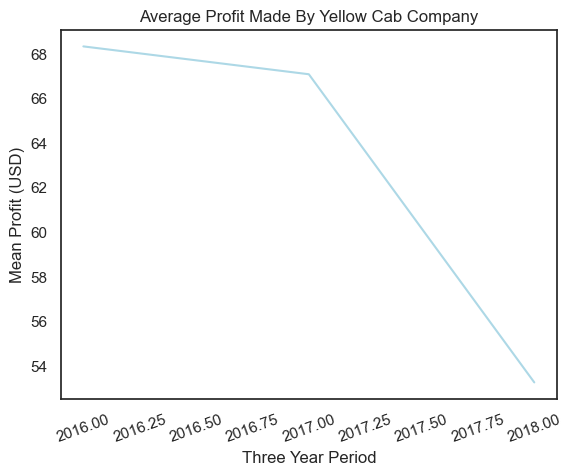

In [211]:
# Aggregating and plotting data
yellow_yearly_avg = Yellow_Cab_df.groupby('Year')['Profit_Made'].mean()

pink_yearly_avg.plot(color = "lightblue")
plt.xlabel('Three Year Period')
plt.xticks(rotation=20, ha='center')
plt.ylabel('Mean Profit (USD)')
plt.title('Average Profit Made By Yellow Cab Company')
plt.show();

###### Histograms

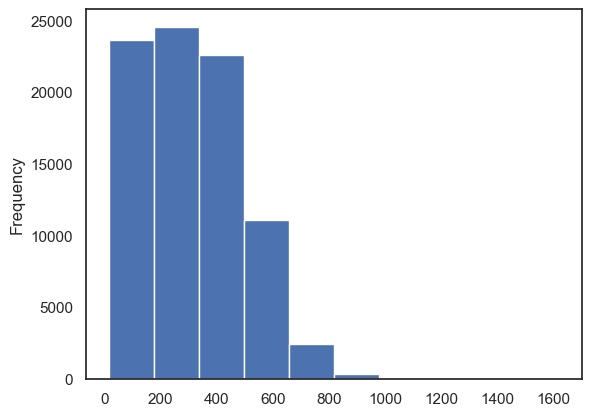

In [212]:
Pink_Cab_df.Price_Charged.plot.hist();

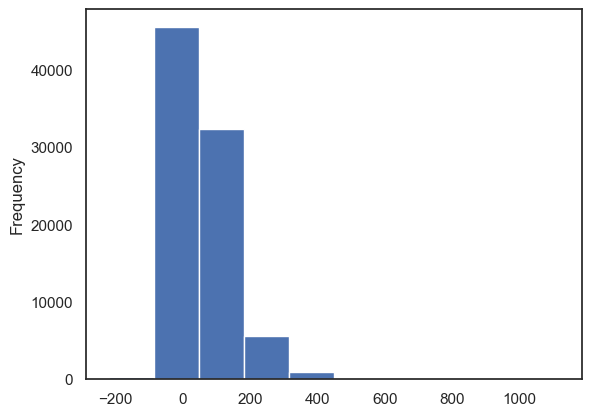

In [213]:
Pink_Cab_df.Profit_Made.plot.hist();

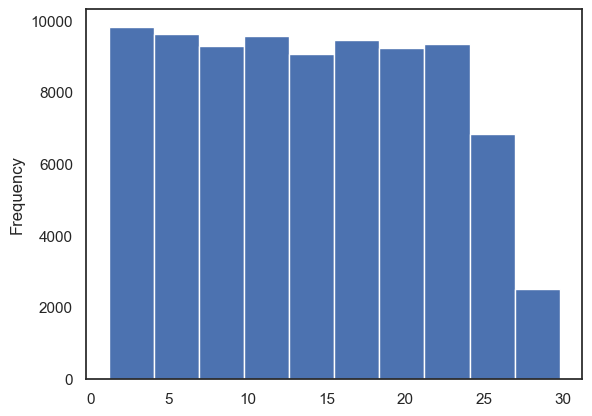

In [214]:
Pink_Cab_df.Miles_Travelled.plot.hist();

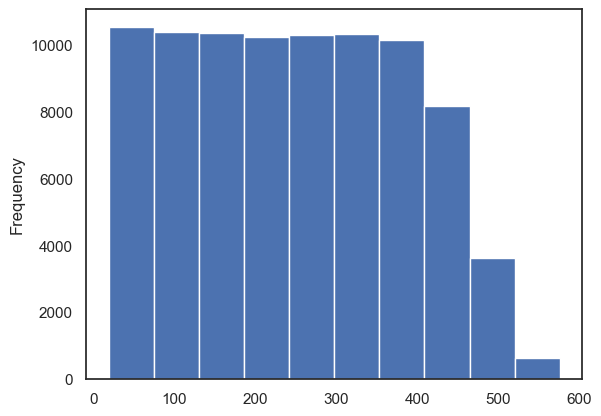

In [215]:
Pink_Cab_df.Cost_of_Trip.plot.hist();

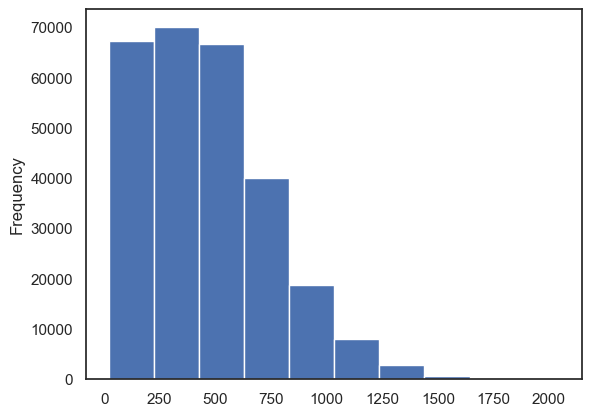

In [216]:
Yellow_Cab_df.Price_Charged.plot.hist();

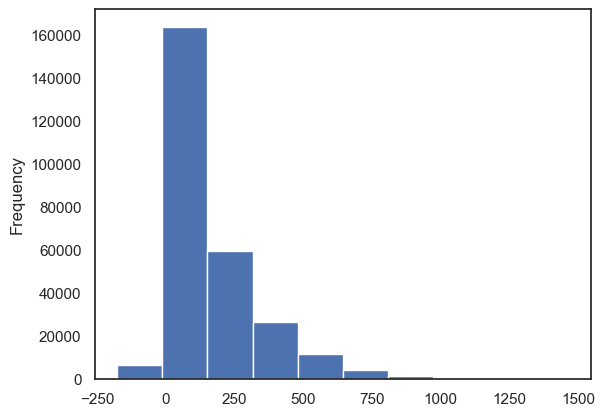

In [217]:
Yellow_Cab_df.Profit_Made.plot.hist();

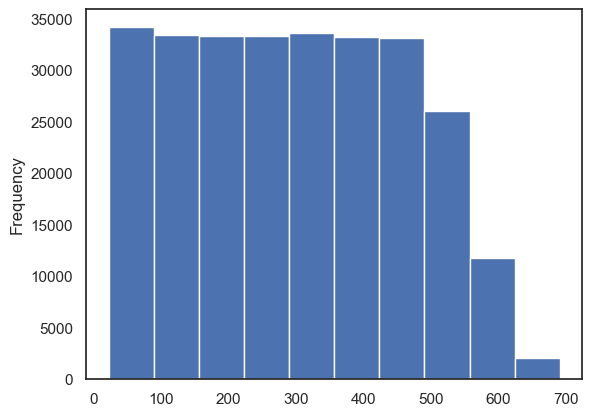

In [218]:
Yellow_Cab_df.Cost_of_Trip.plot.hist();

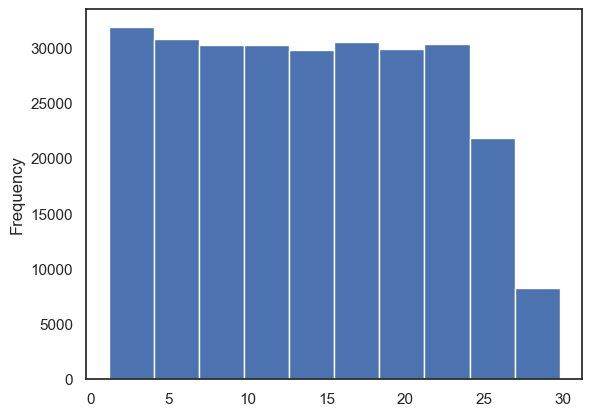

In [219]:
Yellow_Cab_df.Miles_Travelled.plot.hist();

##### Observations and Insights

**Heatmaps**
* From the heatmaps of the correlation matrices of all the dataframes, I noticed a strong correlation between the price charged and the distance travelled. This indicates that the price charged for a trip depends on the distance travelled. 
* Also, there was a strong correlation between the price charged and the profit made. This means the profit made depends in the price charged by the cab companies. 
* Similarly, there was a string correlation between the Cost_of_Trip column and Price_Charged column. This means the cost of a trip depends on the distance travelled. 

**Pairplot**
* The plotted pair plots give a fair idea of the relationship between the columns in our data. I will visualize some of the pair plots using  different visualization methods to have a clearer view and explanation of the relationships between the columns in our data. 

**Crosstab Visualization**
* After visualizing our crosstabs for both dataframes, I have noticed more users of the cab companies prefer card payment to cash payment. Also, both cab companies have more male users than female users

**Boxplots**
* The box plots I visualized gave me a clearer and visual idea of the outliers present in some relevant columns. I noticed a high presence of outliers in the Price_changed and Profit_made columns of the Pink_Cab_df and Yellow_Cab_df

**Histograms**
* From the histogram distributions of some relevant columns, I was able to visually represent the skewness and tailedness of the data in the Price_changed and Profit_Made columns that was observed during the statistical analysis process

**Bar Charts**
* After creating the column, user_returned and visualizing it per each cab company, it was evident that more users returned to use the Yellow Cab company as compared to the Pink Cab company. This is an indication of a high customer retention by the Yellow cab company and a low churn rate.
* Both cab companies experience a negative customer growth in the year 2018 with the pink cab company experiencing a higher percentage
* Both cab companies experience the highest cab usage in December and the lowest cab usage in February 
* The 4th Quarter of the year experiences the highest patronage of both cab companies and the lowest patronage is experienced in the 1st Quarter 
* We can also see that more rides are taken on weekends for both cab companies.
* Both cab companies are used the most on New Year's Eve as compared to other holidays 
* December has the highest monthly profit made which makes sense because it is the month with the highest patronage for both cab companies
* There is a very steep decline in the Profit Margin in 2018 for both can companies. Therefore we will have very high negative profit margin changes for both cab companies
* The average daily profits made on weekdays are almost equal and are quite low compared to weekends
* Both cab companies have the least customers in Pittsburgh,PA


**Scatter plot:**
* After plotting our scatter plots, we can see Los Angeles has more Pink Cabs taken. Also, we can see that New York City has more Yellow cabs taken 

**Pie Charts**
* People between the ages of 20 - 29 years patronise both cab companies more with a percentage of ~32%
* People in the age groups, 60 - 69 years and <20 years patronise both cab companies the least with a percentages of ~6% respectively.
* Both cab companies are used more during Autumn season and are patronised the least during Spring time
* Middle-income people used both cab companies the most
* We can also see that people earning  between 5000 - 25,000 USD patronise both cab companies more. 

**Line plots:**
* The first line chart shows us the decline in daily profits for both cab companies in 2018. Additionally, the Yellow Cab company experiences the average highest daily profit in 2017.
* Both cab companies experience very high daily profits in 2017 
* Both cab companies experience highest cab usage in 2017
* Both cab companies experience a reduction in the number of customers in 2018 and peaked in 2017. This makes sense as since both cab companies experienced high negative profit margins in 2018 and high profits in 2017.
* There is a steep decline in the average yearly profit made by both companies in 2018.

### 8. Hypothesis Testing

* In this section I will be conducting some inferential statistics in the form of a hypothesis test.

**Question:** What is a hypothesis test?

> **Answer:** This is a formal stastical test we use to reject or fail to reject some statistical hypothesis.

For this project, I am going to perform a `one sample t-test`

**Question:** What is a one sample t-test?

> **Answer:** This test is used to test whether or not the mean weight of a population is equal to some value

To perform the t-test, I am going to follow this approach:
1. Define the null hypothesis (H0)
2. Define the alternative hypothesis (H1)
3. Calculate the test statistic
4. Conclusion

**Let us begin**

In [220]:
# Creating the data for our test using the average daily profits made by Yellow Cab company
# Arranged from Monday to Sunday 
# I will be using a confidence level of 0.05

avg_daily_profit = [139.82, 139.66, 138.06, 137.26, 169.89, 167.55, 181.37]

# 1. Defining the null hypothesis
H0 = "The average profit made on Mondays by the Yellow Cab Company is 139.82 USD."

# 2. Defining the alternative hypothesis
H1 = "The average profit made on Mondays by the Yellow Cab Company is more than 139.82 USD"

# 3.Calculating the test statistic and p-value
t_stat, p_value = stats.ttest_1samp(avg_daily_profit, 139.82)

# Printing the results
print("test statistic:", t_stat)
print("p-value:", p_value)

# 4. Conclusion
if p_value < 0.05:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")

test statistic: 1.9060385038315082
p-value: 0.10528463246771369
Fail to reject the null hypothesis.


###### Inferences

After performing t-test on our data, we can conclude that we don't have enough evidence to support the alternative hypothesis since our function returned **"Fail to reject the null hypothesis"**. Hence, we can accept that the daily average profit made on Mondays by the Yellow Cab Company is 139.82 USD

### 9. Recommendations

After conducting a thorough Exploratory Data Analysis (EDA) and Statistical Analysis on our data, it is evident that the 
Yellow Cab company is patronised more than the Pink Cab company. We can also see it has high daily and yearly cab usage and has more customers as compared tp the Pink Cab company.  Also, the Yellow Cab company has more customers returning to use the cab service as compared to the Pink Cab company.
The Yellow Cab company also makes more daily, monthly and yearly profit in comparison to the Pink Cab company.
This clearly indicates the Yellow Cab is a more profitable business.

In conclusion, I recommend the investment firm, XYZ should invest in Yellow Cab Company as it will provide a higher return of investment(ROI) for the firm. 

**PS:** Even though the Yellow Cab company presents itself as a profitable business, the investment firm must proceed with caution if they decide to invest in this company. This is due to the presence of outliers which led to high values for skewness and kurtosis in vital columns such as the Profit_Made and Price_Charged columns. Therefore the investment firm should conduct a thorough risk assessment and choose a good strategy before making their final decision to invest in the Yellow Cab company. Also, it is important to note that there was a decline in the profit margin for Yellow cab company so the investment firm should consider this before investing in the Yellow cab company.


### 10. Glossary

* `base_date` – This is an excel “serial date” format which is actually the number of days since 1900-01-00 i.e., January 1st, 1900. For example, the excel serial date number 43831 represents January 1st, 2020, and after converting 43831 to a DateTime becomes 2020-01-01.

* `DateOffset` – This is the standard kind of date increment used for a date range.

* `Skewness` – This is  a measurement of the distortion of symmetrical distribution or asymmetry in a data set. If the skewness is right-tailed (meaning the right tail is more pronounced than the left), the skew is positive. In this case, the values are more than zero. If the opposite is true and the tail is more pronounced on the left, then the skew is negative, where the values are less than zero.

* `Kurtosis` – This is a measure of the tailedness of a distribution. `Tailedness` is how often outliers occur. `Excess kurtosis` is the tailedness of a distribution relative to a normal distribution.
>Distributions with medium kurtosis (medium tails) are `mesokurtic`(this has a moderate kurtosis value of 3 and excess kurtosis value of 0). Distributions with low kurtosis (thin tails) are `platykurtic`(this has a moderate kurtosis value less than 3 and excess kurtosis value of negative values). Distributions with high kurtosis (fat tails) are `leptokurtic`(this has a moderate kurtosis value greater than 3 and excess kurtosis value of positive values).

* `Outlier` – This is a single data point that goes far outside the average value of a group of statistics. This data point differs significantly from other observations. An outlier may be due to a variability in the measurement, an indication of novel data, or it may be the result of experimental error; the latter are sometimes excluded from the data.

* `InterQuartile Range(IQR)` – This is the difference between the upper and lower quartile values in a set of data. In descriptive statistics, the interquartile range tells you the spread of the middle half of your distribution. The interquartile range (IQR) contains the second and third quartiles, or the middle half of your data.

* `Lower quartile (Q1/25%)` – This is the value under which 25% of data points are found when they are arranged in increasing order.

* `Upper quartile(Q3/75%)` – This is the value under which 75% of data points are found when arranged in increasing order.

* `Frequency` – This is the number of times the value occurs in the data.

* `Mean` – This is the average of the given numbers and is calculated by dividing the sum of given numbers by the total number of numbers. i.e Mean = (Sum of all the observations/Total number of observations).

* `Median(50%)` – This is the middle number in a sorted ascending or descending list of numbers and can be more descriptive of that data set than the average. It is the point above and below which half (50%) of the observed data falls, and so represents the midpoint of the data.

* `Standard deviation` – This is a measure of the amount of variation of a random variable expected about its mean. A low standard deviation indicates that the values tend to be close to the mean of the set, while a high standard deviation indicates that the values are spread out over a wider range.

* `Normal distribution` – This is a probability distribution that is symmetric about the mean, showing that data near the mean are more frequent in occurrence than data far from the mean. In graphical form, the normal distribution appears as a “bell curve”. This is also known as a Gaussian Distribution.

* `Histogram` – This is a graph that shows the frequency of numerical data using rectangles.

* `Bar Chart` – This is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent.

* `Scatterplot` – This is a type of plot or mathematical diagram using Cartesian coordinates to display values for typically two variables for a set of data.

* `Pie Chart` – is a circular statistical graphic which is divided into slices to illustrate numerical proportion.

* `Crosstabs` – Cross-tabulations or contingency tables are tables used to describe relationships between two categorical variables.

* `Pairplot` – This is a plot of pairwise relationships between variables within a dataset. This can be user to plot multiple pairwise bivariate distributions in a dataset.

* `Boxplot` - This is a graph summarising a set of data. The shape of the boxplot shows how the data is distributed and it also shows any outliers. It is a useful way to compare different sets of data as you can draw more than one boxplot per graph.

* `Line Chart` - This chart displays information on a series of data points called 'markers' connected by straight line segments.

* `Correlation Matrix` - This is a statistical technique used to evaluate the relationship between two variables in a